<a href="https://colab.research.google.com/github/Shashwot90/objectdetection/blob/main/portfolio.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

# **2 Tasks - Image Classification. [40]**

In [ ]:
dataset_dir = "/kaggle/input/5-flower-types-classification-dataset/flower_images"

# 2.1 Task1: Data Understanding [5]

In this task, we expect you to collect the data, understand the data about and perform following activities:

In [ ]:
import os
import matplotlib.pyplot as plt
from keras.preprocessing.image import load_img
from PIL import Image

**1. Data Analysis:** In this section you must try to answer following questions.

* How many total images are in the dataset?

In [ ]:
total_images = 0


for class_name in os.listdir(dataset_dir):
    class_path = os.path.join(dataset_dir, class_name)
    if os.path.isdir(class_path):

        num_images = len(os.listdir(class_path))
        print(f"Class: {class_name}, Number of Images: {num_images}")

        total_images += num_images


print("Total number of images in the dataset:", total_images)

Class: Orchid, Number of Images: 1000
Class: Sunflower, Number of Images: 1000
Class: Tulip, Number of Images: 1000
Class: Lotus, Number of Images: 1000
Class: Lilly, Number of Images: 1000
Total number of images in the dataset: 5000


Class: Orchid, Number of Images: 1000
Class: Sunflower, Number of Images: 1000
Class: Tulip, Number of Images: 1000
Class: Lotus, Number of Images: 1000
Class: Lilly, Number of Images: 1000
Total number of images in the dataset: 5000


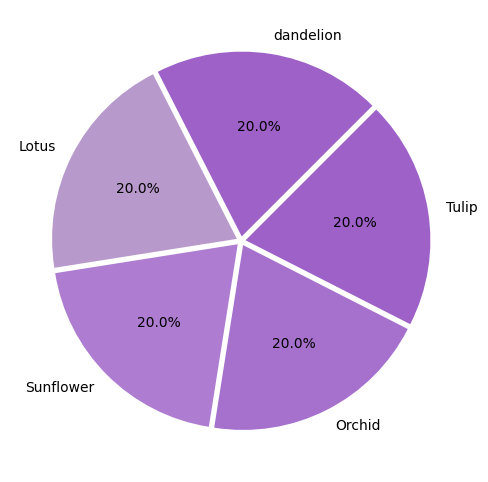

In [ ]:
import os
import matplotlib.pyplot as plt

total_images = 0
class_counts = {'Lilly': 0, 'Lotus': 0, 'Sunflower': 0, 'Orchid': 0, 'Tulip': 0}

for class_name in os.listdir(dataset_dir):
    class_path = os.path.join(dataset_dir, class_name)
    if os.path.isdir(class_path):
        num_images = len(os.listdir(class_path))
        print(f"Class: {class_name}, Number of Images: {num_images}")
        total_images += num_images
        class_counts[class_name] = num_images

print("Total number of images in the dataset:", total_images)


if all(value == 0 for value in class_counts.values()):
    print("No data available for visualization.")
else:
    plt.figure(figsize=(14,6))
    colors = ["#9D61C8", "#B799CB", "#ae7cd1", "#a670cd"]
    plt.pie([class_counts['Lilly'], class_counts['Lotus'], class_counts['Sunflower'], class_counts['Orchid'], class_counts['Tulip']],
            labels=['dandelion','Lotus', 'Sunflower', 'Orchid', 'Tulip'],
            colors=colors, autopct='%.1f%%', explode=(0.025,0.025,0.025,0.025,0.025),
            startangle=45)
    plt.show()


* How balanced is your dataset?i.e. image per class or label

In [ ]:
class_counts = {}


for class_name in os.listdir(dataset_dir):
    class_path = os.path.join(dataset_dir, class_name)
    if os.path.isdir(class_path):

        num_images = len(os.listdir(class_path))
        class_counts[class_name] = num_images

        total_images += num_images


print("Class\t\tNumber of Images\tPercentage")
print("----------------------------------------------------")
for class_name, count in class_counts.items():
    percentage = (count / total_images) * 100
    print(f"{class_name}\t\t{count}\t\t{percentage:.2f}%")

Class		Number of Images	Percentage
----------------------------------------------------
Orchid		1000		10.00%
Sunflower		1000		10.00%
Tulip		1000		10.00%
Lotus		1000		10.00%
Lilly		1000		10.00%


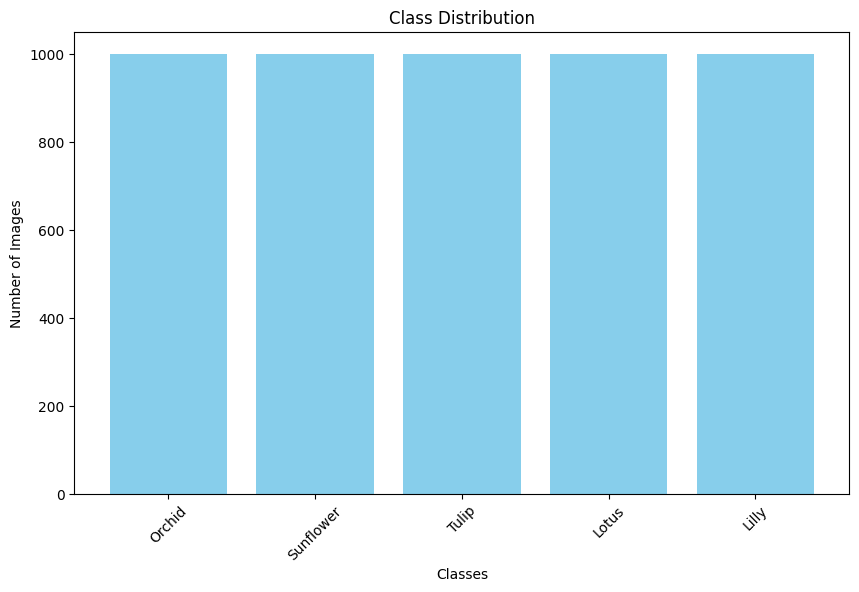

In [ ]:

plt.figure(figsize=(10, 6))
plt.bar(class_counts.keys(), class_counts.values(), color='skyblue')
plt.xlabel('Classes')
plt.ylabel('Number of Images')
plt.title('Class Distribution')
plt.xticks(rotation=45)
plt.show()

* How is your data distributed among train, valid and test set? If not How will you split the dataset among aforementioned folder.

In [ ]:
import os
import shutil
import random

dataset_dir = "/kaggle/input/5-flower-types-classification-dataset/flower_images"
split_dir = "/kaggle/working/5-flower-types-classification-dataset/flower_images/flowers_split1"
os.makedirs(split_dir, exist_ok=True)

train_ratio = 0.7
val_ratio = 0.15
test_ratio = 0.15

train_dir = os.path.join(split_dir, "train")
val_dir = os.path.join(split_dir, "val")
test_dir = os.path.join(split_dir, "test")
os.makedirs(train_dir, exist_ok=True)
os.makedirs(val_dir, exist_ok=True)
os.makedirs(test_dir, exist_ok=True)

for class_name in os.listdir(dataset_dir):
    class_dir = os.path.join(dataset_dir, class_name)
    if os.path.isdir(class_dir):

        image_files = [f for f in os.listdir(class_dir) if f.endswith(".jpg") or f.endswith(".png")]
        random.shuffle(image_files)

        num_images = len(image_files)
        num_train = int(num_images * train_ratio)
        num_val = int(num_images * val_ratio)
        num_test = num_images - num_train - num_val

        train_images = image_files[:num_train]
        val_images = image_files[num_train:num_train + num_val]
        test_images = image_files[num_train + num_val:]

        for img in train_images:
            src = os.path.join(class_dir, img)
            dst = os.path.join(train_dir, class_name, img)  # Adjusted destination directory
            os.makedirs(os.path.dirname(dst), exist_ok=True)
            shutil.copy(src, dst)

        for img in val_images:
            src = os.path.join(class_dir, img)
            dst = os.path.join(val_dir, class_name, img)  # Adjusted destination directory
            os.makedirs(os.path.dirname(dst), exist_ok=True)
            shutil.copy(src, dst)

        for img in test_images:
            src = os.path.join(class_dir, img)
            dst = os.path.join(test_dir, class_name, img)  # Adjusted destination directory
            os.makedirs(os.path.dirname(dst), exist_ok=True)
            shutil.copy(src, dst)

print("Dataset split into train, validation, and test sets successfully.")


Dataset split into train, validation, and test sets successfully.


/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


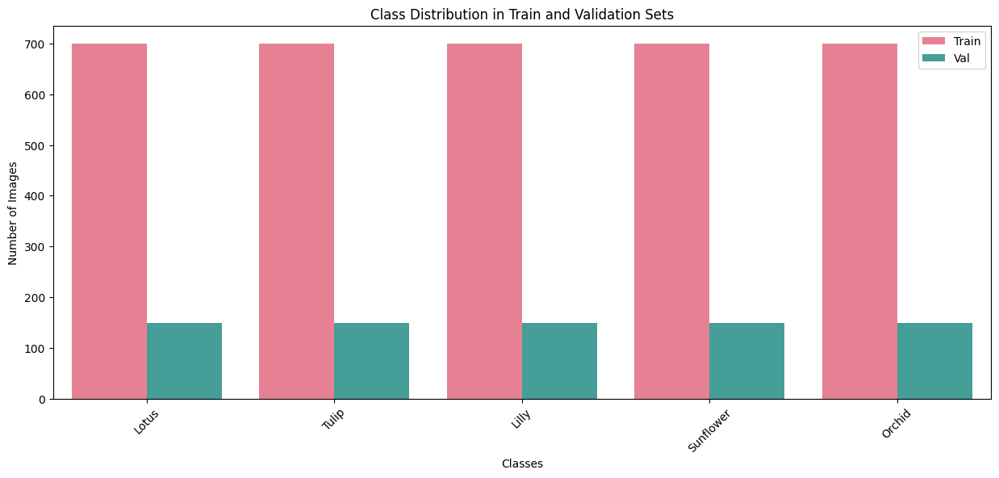

In [ ]:
import seaborn as sns


train_class_counts = {class_name: len(os.listdir(os.path.join(train_dir, class_name))) for class_name in os.listdir(train_dir)}
val_class_counts = {class_name: len(os.listdir(os.path.join(val_dir, class_name))) for class_name in os.listdir(val_dir)}


plt.figure(figsize=(15, 6))
sns.barplot(x=list(train_class_counts.keys()) + list(val_class_counts.keys()),
            y=list(train_class_counts.values()) + list(val_class_counts.values()),
            hue=['Train'] * len(train_class_counts) + ['Val'] * len(val_class_counts),
            palette=sns.color_palette("husl", 2))
plt.xlabel('Classes')
plt.ylabel('Number of Images')
plt.title('Class Distribution in Train and Validation Sets')
plt.xticks(rotation=45)
plt.legend()
plt.show()


/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


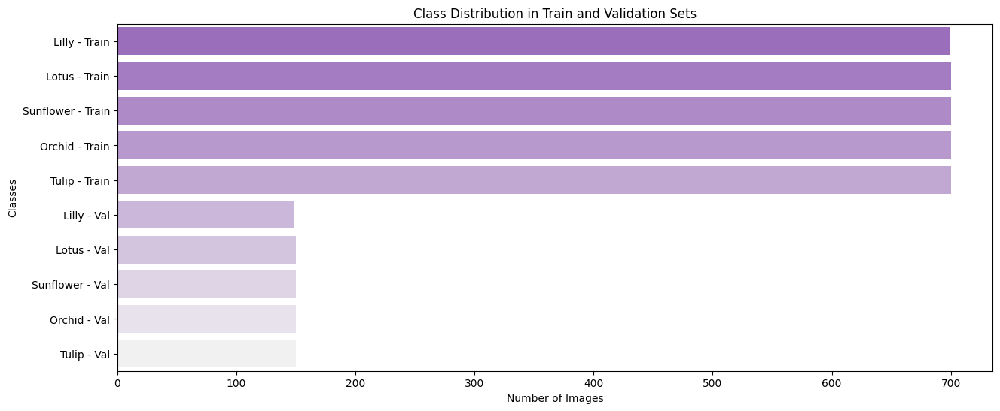

In [ ]:
import os
import matplotlib.pyplot as plt
import seaborn as sns


train_dir = "/kaggle/working/5-flower-types-classification-dataset/flower_images/flowers_split1/train"
val_dir = "/kaggle/working/5-flower-types-classification-dataset/flower_images/flowers_split1/val"


classes = ['Lilly', 'Lotus', 'Sunflower', 'Orchid', 'Tulip']


train_counts = {class_name: len(os.listdir(os.path.join(train_dir, class_name))) for class_name in classes}
val_counts = {class_name: len(os.listdir(os.path.join(val_dir, class_name))) for class_name in classes}


train_counts_values = [train_counts[class_name] for class_name in classes]
val_counts_values = [val_counts[class_name] for class_name in classes]


train_labels = [f'{cls} - Train' for cls in classes]
val_labels = [f'{cls} - Val' for cls in classes]


counts = train_counts_values + val_counts_values
labels = train_labels + val_labels


palette = sns.light_palette("#9D61C8", reverse=True, n_colors=len(labels))


plt.figure(figsize=(15, 6))
sns.barplot(x=counts, y=labels, palette=palette)
plt.xlabel('Number of Images')
plt.ylabel('Classes')
plt.title('Class Distribution in Train and Validation Sets')
plt.show()


**2. Data Visualization:** Following must be done in this step:

* Visualize at least one image per class.

In [ ]:
import os
import shutil
import random

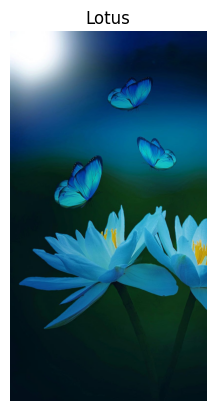

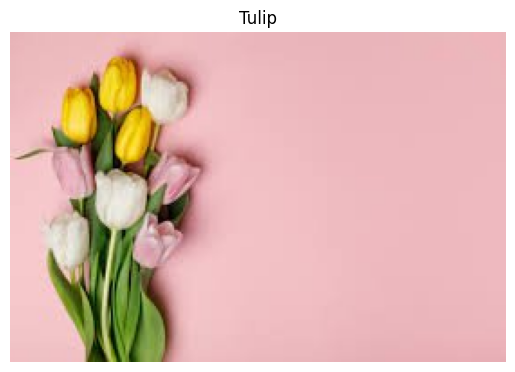

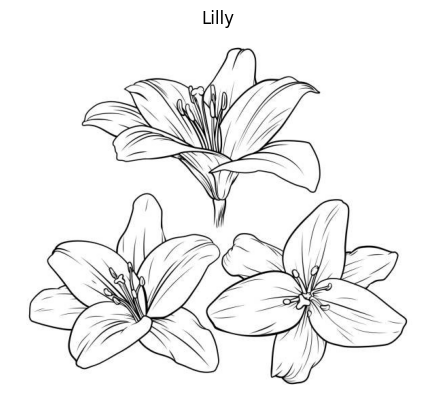

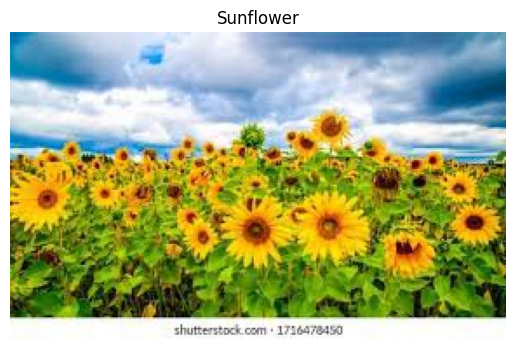

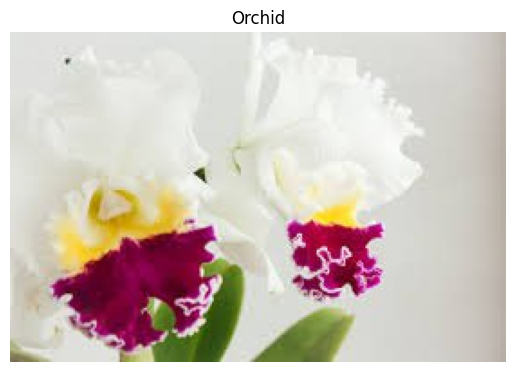

In [ ]:


train_dir = '/kaggle/working/5-flower-types-classification-dataset/flower_images/flowers_split1/train'


classes = os.listdir(train_dir)


num_cols = 3


images_displayed = {}


for class_name in classes:

    class_dir = os.path.join(train_dir, class_name)
    image_files = [f for f in os.listdir(class_dir) if f.endswith(".jpg") or f.endswith(".png")]


    if len(image_files) > 0:

        image_path = os.path.join(class_dir, image_files[0])
        img = load_img(image_path)


        plt.imshow(img)
        plt.title(class_name)
        plt.axis('off')
        plt.show()


* Investigate Visually whether there are any corrupted images or not.

In [ ]:



def is_corrupted_image(image_path):
    try:

        img = Image.open(image_path)
        img.verify()
        return False
    except (IOError, SyntaxError):
        return True


corrupted_images = []
for class_name in os.listdir(train_dir):
    class_dir = os.path.join(train_dir, class_name)
    if os.path.isdir(class_dir):
        for img_name in os.listdir(class_dir):
            img_path = os.path.join(class_dir, img_name)
            if is_corrupted_image(img_path):
                corrupted_images.append(img_path)


if corrupted_images:
    print("Corrupted images found:")
    for img_path in corrupted_images:
        print(img_path)
        img = Image.open(img_path)
        plt.imshow(img)
        plt.axis('off')
        plt.show()
else:
    print("No corrupted images found.")


No corrupted images found.


**3. Data Pre - processing:** Following must be done in this step:

* What kind of Data Generator you used for the task?

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator


train_dir = "/kaggle/working/5-flower-types-classification-dataset/flower_images/flowers_split1/train"
val_dir = "/kaggle/working/5-flower-types-classification-dataset/flower_images/flowers_split1/val"
test_dir = "/kaggle/working/5-flower-types-classification-dataset/flower_images/flowers_split1/test"


train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True,
    fill_mode='nearest'
)


train_gen = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'
)


val_gen = ImageDataGenerator(rescale=1./255).flow_from_directory(
    val_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'
)


test_gen = ImageDataGenerator(rescale=1./255).flow_from_directory(
    test_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'
)


Found 3499 images belonging to 5 classes.
Found 749 images belonging to 5 classes.
Found 751 images belonging to 5 classes.


* Did you use any augmentations or not if yes visualize one image per augmentations style you have used.?

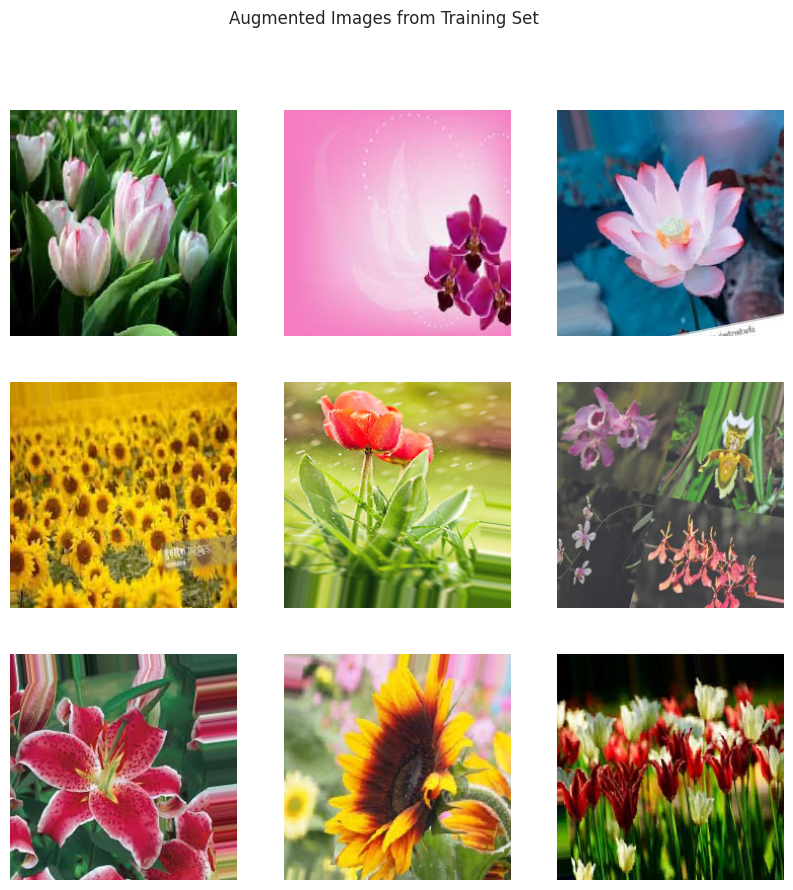

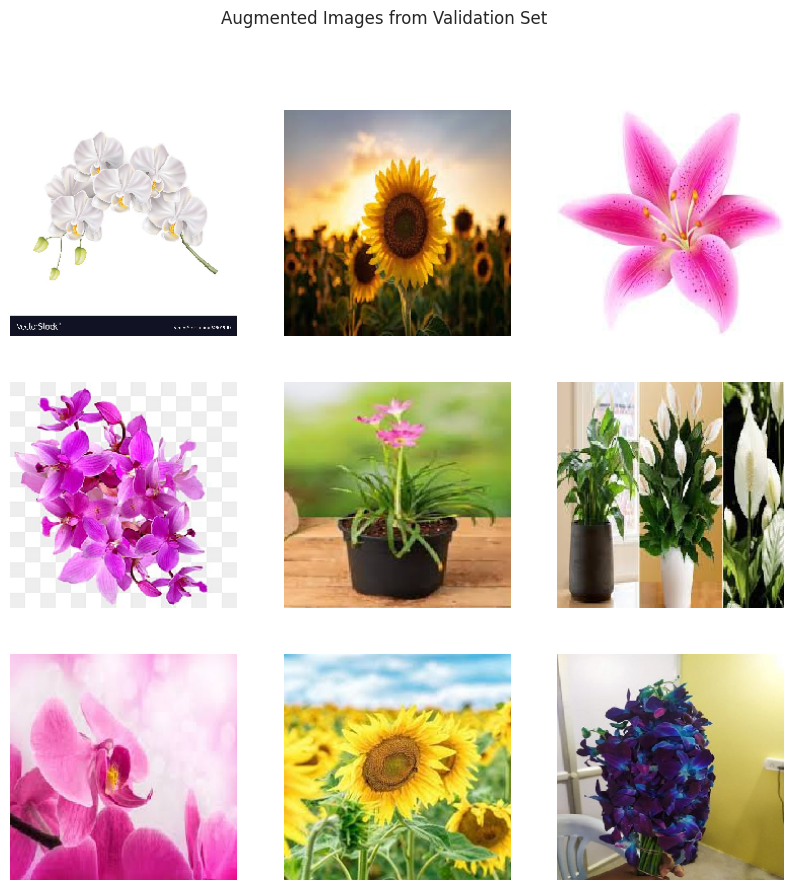

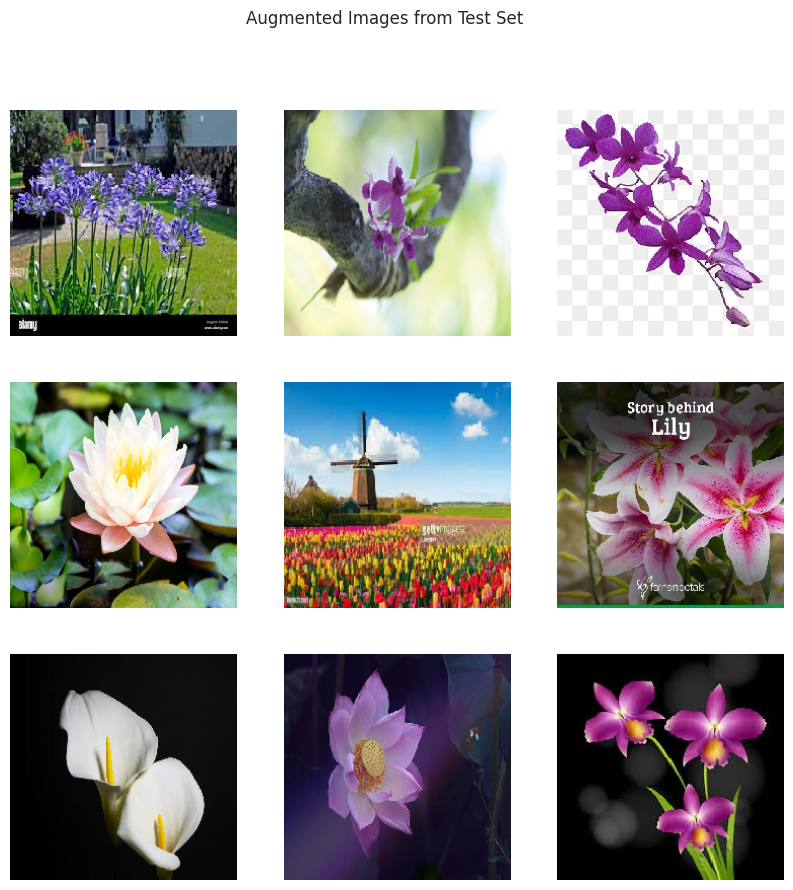

In [ ]:
import numpy as np
import matplotlib.pyplot as plt


train_batch, _ = next(train_gen)


val_batch, _ = next(val_gen)


test_batch, _ = next(test_gen)


plt.figure(figsize=(10, 10))
for i in range(9):
    plt.subplot(3, 3, i + 1)
    plt.imshow(train_batch[i])
    plt.axis('off')
plt.suptitle('Augmented Images from Training Set')
plt.show()


plt.figure(figsize=(10, 10))
for i in range(9):
    plt.subplot(3, 3, i + 1)
    plt.imshow(val_batch[i])
    plt.axis('off')
plt.suptitle('Augmented Images from Validation Set')
plt.show()


plt.figure(figsize=(10, 10))
for i in range(9):
    plt.subplot(3, 3, i + 1)
    plt.imshow(test_batch[i])
    plt.axis('off')
plt.suptitle('Augmented Images from Test Set')
plt.show()


Found 3499 images belonging to 5 classes.


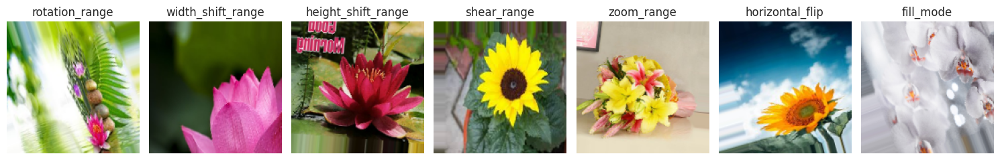

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator


train_dir = "/kaggle/working/5-flower-types-classification-dataset/flower_images/flowers_split1/train"


augmentation_params = {
    "rotation_range": 20,
    "width_shift_range": 0.1,
    "height_shift_range": 0.1,
    "shear_range": 0.1,
    "zoom_range": 0.1,
    "horizontal_flip": True,
    "fill_mode": 'nearest'
}


datagen = ImageDataGenerator(**augmentation_params)


augmented_images = []


batch = datagen.flow_from_directory(
    train_dir,
    target_size=(150, 150),
    batch_size=1,
    class_mode=None
)


for i in range(len(augmentation_params)):
    augmented_img = next(batch)
    augmented_images.append(augmented_img[0])



titles = list(augmentation_params.keys())
fig, axes = plt.subplots(1, len(augmentation_params), figsize=(15, 3))

for i, augmented_img in enumerate(augmented_images):
    axes[i].imshow(augmented_img.astype(np.uint8))
    axes[i].set_title(titles[i])
    axes[i].axis('off')

plt.tight_layout()
plt.show()


# **2.2 Task2: Building Fully Connected Neural Network[8].**

Cautions!! This section has multiple sub - tasks.

In this section you are expected to complete following tasks:

**1. Model Building:[2]**

Based on the size of your input image, design and build FCNN. You can have as many layers you think is required for your task. You should be able to explain your model summary.

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten, BatchNormalization


input_shape = (150, 150, 3)


model1 = Sequential()


model1.add(Flatten(input_shape=input_shape))


model1.add(Dense(1024, activation='relu'))
model1.add(BatchNormalization())


model1.add(Dense(512, activation='relu'))
model1.add(BatchNormalization())

model1.add(Dense(512, activation='relu'))
model1.add(BatchNormalization())


model1.add(Dense(512, activation='relu'))
model1.add(BatchNormalization())
model1.add(Dropout(0.2))

model1.add(Dense(512, activation='relu'))
model1.add(BatchNormalization())
model1.add(Dropout(0.2))

model1.add(Dense(128, activation='relu'))
model1.add(BatchNormalization())
model1.add(Dropout(0.2))

model1.add(Dense(64, activation='relu'))
model1.add(BatchNormalization())
model1.add(Dropout(0.2))


num_classes = 5
model1.add(Dense(num_classes, activation='softmax'))


model1.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])


model1.summary()


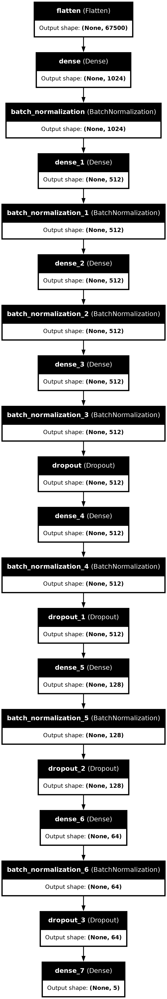

In [ ]:

tf.keras.utils.plot_model(model1, to_file='model.png', show_shapes=True, show_layer_names=True)

**2. Train the Model:[2]**

* Once the model is built, Train your model for as many epochs you think is necessary. cautions: Think about the computing complexity, we suggest you to utilize the GPU of the Google Colab.!!!

* You can use any optimizer and loss function of your choice.

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping


epochs = 100 #100


early_stopping = EarlyStopping(monitor='val_loss', patience=10, verbose=1)


steps_per_epoch = len(train_gen)
validation_steps = len(val_gen)


history = model1.fit(
    train_gen,
    steps_per_epoch=steps_per_epoch,
    epochs=epochs,
    validation_data=val_gen,
    validation_steps=validation_steps,
    callbacks=[early_stopping]
)


Epoch 1/5


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


110/110 ━━━━━━━━━━━━━━━━━━━━ 108s 900ms/step - accuracy: 0.2732 - loss: 1.9533 - val_accuracy: 0.3191 - val_loss: 2.2094
Epoch 2/5
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 455us/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_accuracy: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/5


/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


 22/110 ━━━━━━━━━━━━━━━━━━━━ 1:17 883ms/step - accuracy: 0.3336 - loss: 1.6216

KeyboardInterrupt: 

* Please, Plot and show training loss/validation loss behaviour for each iterations.

In [ ]:

training_accuracy = history.history['accuracy']
validation_accuracy = history.history['val_accuracy']


training_loss = history.history['loss']
validation_loss = history.history['val_loss']


plt.plot(training_loss, label='Training Loss')
plt.plot(validation_loss, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()


plt.plot(training_accuracy, label='Training Accuracy')
plt.plot(validation_accuracy, label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.show()


**3. Evaluate the Model:[2]**

* Pick appropriate evaluation metrics to evaluate your model.

FCNN

In [ ]:
_# Plot training & validation loss values
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('TF Model before Fine Tuning accuracy values')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()


In [ ]:
_# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('TF Model Before Fine Tuning loss values')
plt.ylabel('loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

In [ ]:
train_score = model1.evaluate(train_gen, verbose= 1)
valid_score = model1.evaluate(valid_gen, verbose= 1)
test_score = model1.evaluate(test_gen, verbose= 1)

print("Train Loss: ", train_score[0])
print("Train Accuracy: ", train_score[1])
print('-' * 20)
print("Validation Loss: ", valid_score[0])
print("Validation Accuracy: ", valid_score[1])
print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

In [ ]:
preds = model1.predict(test_gen)
y_pred = np.argmax(preds, axis=1)



In [ ]:
g_dict = test_gen.class_indices
classes = list(g_dict.keys())
# Confusion matrix
cm = confusion_matrix(test_gen.classes, y_pred)
cm

plt.figure(figsize= (10, 10))
plt.imshow(cm, interpolation= 'nearest', cmap= plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation= 45)
plt.yticks(tick_marks, classes)

thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, cm[i, j], horizontalalignment= 'center',
             color= 'white' if cm[i, j] > thresh else 'black')

plt.tight_layout()
plt.ylabel('True Label')
plt.xlabel('Predicted Label')

plt.show()

In [ ]:
print(classification_report(test_gen.classes, y_pred,
                            target_names= classes))

FCNN

In [ ]:

test_loss, test_accuracy = model.evaluate(test_generator, steps=test_gen.samples // test_generator.batch_size)


print("Test Accuracy:", test_accuracy)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

# Assuming you have predicted class indices for each sample
y_score = np.argmax(preds, axis=1)

# Assuming test_generator.classes contains true class labels of your test data
y_true = test_gen.classes

# Binarize the true labels
n_classes = len(np.unique(y_true))
y_true_binarized = label_binarize(y_true, classes=np.arange(n_classes))

# Binarize the predicted class indices
y_score_binarized = label_binarize(y_score, classes=np.arange(n_classes))

# Compute ROC curve and ROC area
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_binarized[:, i], y_score_binarized[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_true_binarized.ravel(), y_score_binarized.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# Plot micro-average ROC curve
plt.figure()
plt.plot(fpr["micro"], tpr["micro"], label='micro-average ROC curve (area = {0:0.2f})'.format(roc_auc["micro"]), color='deeppink', linestyle=':', linewidth=4)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


* Interpret and compare the performance on Train Set and Test Set.

In [ ]:
def get_pred(model, test_gen):

    preds = model.predict(test_gen)
    y_pred = np.argmax(preds, axis = 1)

    return y_pred

import itertools
def plot_confusion_matrix(test_gen, y_pred):

    g_dict = test_gen.class_indices
    classes = list(g_dict.keys())

    # Display the confusion matrix
    cm = confusion_matrix(test_gen.classes, y_pred)

    plt.figure(figsize= (10, 10))
    plt.imshow(cm, interpolation= 'nearest', cmap= plt.cm.Blues)
    plt.title('Confusion Matrix')
    plt.colorbar()

    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation= 45)
    plt.yticks(tick_marks, classes)

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j], horizontalalignment= 'center', color= 'white' if cm[i, j] > thresh else 'black')


    plt.tight_layout()
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')

    plt.show()

In [ ]:
y_pred = get_pred(model, test_generator)
plot_confusion_matrix(test_generator, y_pred)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from scipy import interp

# Make predictions on test data
preds = model.predict(test_generator)

# Binarize the true labels
test_labels = label_binarize(test_generator.classes, classes=np.arange(preds.shape[1]))

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(preds.shape[1]):
    fpr[i], tpr[i], _ = roc_curve(test_labels[:, i], preds[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(test_labels.ravel(), preds.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# Plot ROC curve for each class
plt.figure()
plt.plot(fpr["micro"], tpr["micro"], label='micro-average ROC curve (area = {0:0.2f})'.format(roc_auc["micro"]), color='deeppink', linestyle=':', linewidth=4)

for i in range(preds.shape[1]):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Print test accuracy
print("Test Accuracy:", test_accuracy)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

# Assuming you have predicted class indices for each sample
y_score = np.argmax(preds, axis=1)

# Assuming test_generator.classes contains true class labels of your test data
y_true = test_generator.classes

# Binarize the true labels
n_classes = len(np.unique(y_true))
y_true_binarized = label_binarize(y_true, classes=np.arange(n_classes))

# Binarize the predicted class indices
y_score_binarized = label_binarize(y_score, classes=np.arange(n_classes))

# Compute ROC curve and ROC area
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_binarized[:, i], y_score_binarized[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_true_binarized.ravel(), y_score_binarized.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# Plot micro-average ROC curve
plt.figure()
plt.plot(fpr["micro"], tpr["micro"], label='micro-average ROC curve (area = {0:0.2f})'.format(roc_auc["micro"]), color='deeppink', linestyle=':', linewidth=4)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


**4. Prediction:[2]**

In this step we expect you to make an inference on the unseen data {feel free to use test image as an example of unseen data}.

In [ ]:
import matplotlib.pyplot as plt


test_images, test_labels = next(test_generator)


predictions = model.predict(test_images)
predicted_classes = np.argmax(predictions, axis=1)


class_labels = list(test_generator.class_indices.keys())


plt.figure(figsize=(15, 15))
num_plots = min(len(test_images), 10)
for i in range(num_plots):
    plt.subplot(5, 5, i + 1)
    plt.imshow(test_images[i])
    plt.axis('off')
    true_label = class_labels[np.argmax(test_labels[i])]
    predicted_label = class_labels[predicted_classes[i]]
    color = 'green' if true_label == predicted_label else 'red'
    plt.title(f'True: {true_label}\nPredicted: {predicted_label}', color=color)
plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import array_to_img


test_data = [(test_generator[i][0][0], test_generator[i][1][0]) for i in range(len(test_generator))]


class_names = ['daisy', 'dandelion', 'rose', 'sunflower', 'tulip' ]

fig, ax = plt.subplots(figsize=(8, 12), ncols=3, nrows=4)

for row in range(4):
    i = np.random.randint(0, high=len(test_data))
    img, label = test_data[i]


    img = array_to_img(img)


    percent = model.predict(np.expand_dims(img, axis=0))[0]
    pred_class_idx = np.argmax(percent)
    pred_class_name = class_names[pred_class_idx]


    true_class_idx = np.argmax(label)
    true_class_name = class_names[true_class_idx]


    ax[row][0].imshow(img)
    ax[row][0].set_title('Real : {}'.format(true_class_name))
    ax[row][0].axis('off')


    ax[row][1].barh(class_names, percent)
    ax[row][1].set_aspect(0.1)
    ax[row][1].set_title('Predicted Class: {} ({}%)'.format(pred_class_name, round(percent[pred_class_idx] * 100, 2)))
    ax[row][1].set_xlim(0, 1.)


    color = 'green' if pred_class_idx == true_class_idx else 'red'

    ax[row][2].barh(class_names, percent, color=color)
    ax[row][2].set_aspect(0.1)
    ax[row][2].set_title('Prediction Correctness')
    ax[row][2].set_xlim(0, 1.)

plt.tight_layout()
plt.show()


In [ ]:

predictions = model.predict(test_generator)


predicted_classes = np.argmax(predictions, axis=1)


true_classes = test_generator.classes


class_labels = list(test_generator.class_indices.keys())


for i in range(len(true_classes)):
    print(f"True class: {class_labels[true_classes[i]]}, Predicted class: {class_labels[predicted_classes[i]]}")


# **2.3 Task3: Building Convolutional Neural Network[12].**

In this section we expect you to perform following tasks:

**1. Model Building:[3]**

Based on the size of your input image, design and build FCNN. You can have as many layers you think is required for your task.

You should be able to explain your model summary.

CNN

In [ ]:
import numpy as np
import pandas as pd
import os
import itertools
from PIL import Image
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('darkgrid')

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adamax
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten,Dense,Dropout, BatchNormalization

import warnings
warnings.filterwarnings("ignore")

print("Load Models")

Load Models


In [ ]:
data_dir = "/kaggle/input/5-flower-types-classification-dataset/flower_images"

filepaths = []
labels = []

folds = os.listdir(data_dir)

for fold in folds:
    foldpaths = os.path.join(data_dir, fold)
    filelists = os.listdir(foldpaths)

    for file in filelists:
        filepath= os.path.join(foldpaths, file)

        filepaths.append(filepath)
        labels.append(fold)

Fseries = pd.Series(filepaths, name= 'Filepath')
Lseries = pd.Series(labels, name='Label')

df = pd.concat([Fseries, Lseries], axis=1)
df.head()

,Filepath,Label
0,/kaggle/input/5-flower-types-classification-da...,Orchid
1,/kaggle/input/5-flower-types-classification-da...,Orchid
2,/kaggle/input/5-flower-types-classification-da...,Orchid
3,/kaggle/input/5-flower-types-classification-da...,Orchid
4,/kaggle/input/5-flower-types-classification-da...,Orchid


In [ ]:
train_df, dummy_df = train_test_split(df, test_size=0.1, shuffle= True, random_state= 42,
                                     stratify= df['Label'])

valid_df, test_df = train_test_split(dummy_df, test_size=0.5, shuffle= True, random_state= 42,
                                    stratify= dummy_df['Label'])

In [ ]:
batch_size = 16
image_size = (224,224)

gen = ImageDataGenerator()

# Define your ImageDataGenerator for augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    fill_mode='nearest',
    channel_shift_range=0.2  # You can adjust this value
)



train_gen = train_datagen.flow_from_dataframe(train_df, x_col = 'Filepath', y_col= 'Label',
                                   class_mode= 'categorical', color='rgb',
                                   batch_size=batch_size, target_size= image_size)

val_gen = gen.flow_from_dataframe(valid_df, x_col = 'Filepath', y_col= 'Label',
                                   class_mode= 'categorical', color='rgb',
                                   batch_size=batch_size, target_size= image_size)

test_gen = gen.flow_from_dataframe(test_df, x_col = 'Filepath', y_col= 'Label',
                                   class_mode= 'categorical', color='rgb',
                                   batch_size=batch_size, target_size= image_size)

Found 4500 validated image filenames belonging to 5 classes.
Found 250 validated image filenames belonging to 5 classes.
Found 250 validated image filenames belonging to 5 classes.


Found 4500 validated image filenames belonging to 5 classes.


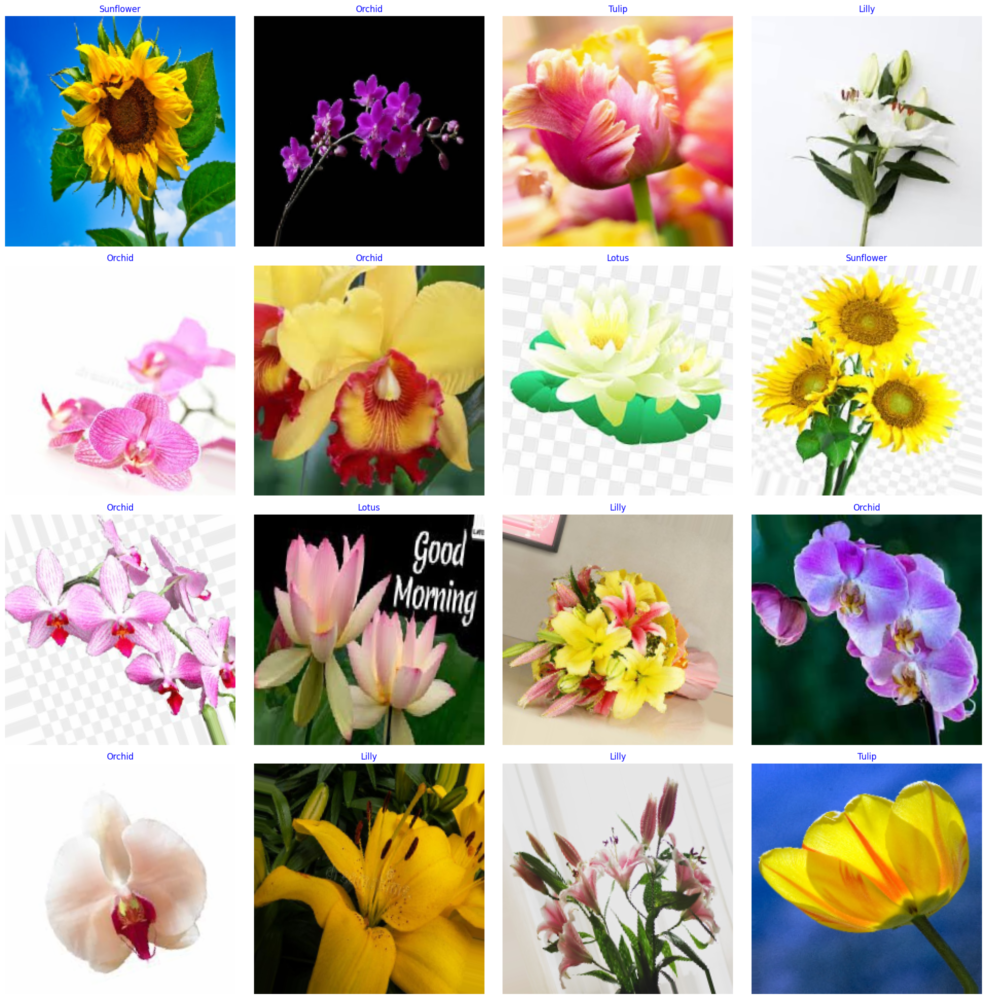

In [ ]:

import numpy as np
import matplotlib.pyplot as plt

batch_size = 16
image_size = (224,224)

# Define your ImageDataGenerator for augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    fill_mode='nearest',
    channel_shift_range=0.2  # You can adjust this value
)

# Load your data using flow_from_dataframe
train_gen = train_datagen.flow_from_dataframe(train_df, x_col='Filepath', y_col='Label',
                                              class_mode='categorical', color_mode='rgb',
                                              batch_size=batch_size, target_size=image_size)

# Visualize the augmented images
images, labels = next(train_gen)

# Plot the images
plt.figure(figsize=(20, 20))
for i in range(16):
    plt.subplot(4, 4, i + 1)
    image = images[i]  # No need to scale as it's already done in ImageDataGenerator
    plt.imshow(image)
    index = np.argmax(labels[i])  # Get image index
    class_name = classes_name[index]  # Get class of image
    plt.title(class_name, color='blue', fontsize=12)
    plt.axis('off')
plt.tight_layout()
plt.show()


Found 4500 validated image filenames belonging to 5 classes.


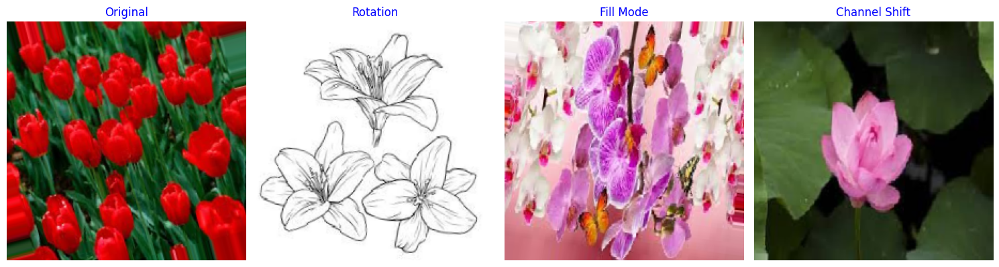

In [ ]:

import numpy as np
import matplotlib.pyplot as plt

# Define your ImageDataGenerator for augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    fill_mode='nearest',
    channel_shift_range=0.2  # You can adjust this value
)

# Load a single image using flow_from_dataframe
single_image_gen = train_datagen.flow_from_dataframe(train_df, x_col='Filepath', y_col='Label',
                                                     class_mode='categorical', color_mode='rgb',
                                                     batch_size=1, target_size=image_size)

# Get the original image
original_image, _ = next(single_image_gen)

# Define augmentation names for plotting
augmentation_names = ['Original', 'Rotation', 'Fill Mode', 'Channel Shift']

# Visualize each augmented image
plt.figure(figsize=(15, 5))

# Plot original image
plt.subplot(1, 4, 1)
plt.imshow(original_image[0])  # Access the first image in the batch
plt.title(augmentation_names[0], color='blue', fontsize=12)
plt.axis('off')

# Generate and plot augmented images
for i, aug_name in enumerate(augmentation_names[1:]):
    augmented_image, _ = next(single_image_gen)  # Generate next augmented image
    plt.subplot(1, 4, i + 2)
    plt.imshow(augmented_image[0])  # Access the first image in the batch
    plt.title(aug_name, color='blue', fontsize=12)
    plt.axis('off')

plt.tight_layout()
plt.show()


In [ ]:
channels = 3
image_size = (224, 224)
image_shape =(image_size[0], image_size[1], channels)

class_count = len(list(train_gen.class_indices.keys()))

model = Sequential([
    Conv2D(filters = 32 , kernel_size = (3,3) , padding='same', activation='relu', input_shape=image_shape),
    Conv2D(filters = 32 , kernel_size = (3,3) , padding='same', activation='relu'),
    Conv2D(filters = 32 , kernel_size = (3,3) , padding='same', activation='relu'),

    BatchNormalization(),
    MaxPooling2D((2, 2)),

    Conv2D(filters = 64 , kernel_size = (3,3) , padding='same', activation='relu'),
    Conv2D(filters = 64 , kernel_size = (3,3) , padding='same', activation='relu'),
    Conv2D(filters = 64 , kernel_size = (3,3) , padding='same', activation='relu'),

    BatchNormalization(),
    MaxPooling2D((2, 2)),

    Conv2D(filters = 128 , kernel_size = (3,3) , padding='same', activation='relu'),
    Conv2D(filters = 128 , kernel_size = (3,3) , padding='same', activation='relu'),
    Conv2D(filters = 128 , kernel_size = (3,3) , padding='same', activation='relu'),

    BatchNormalization(),
    MaxPooling2D((2, 2)),

    Conv2D(filters = 256 , kernel_size = (3,3) , padding='same', activation='relu'),
    Conv2D(filters = 256 , kernel_size = (3,3) , padding='same', activation='relu'),

    BatchNormalization(),
    MaxPooling2D((2, 2)),

    Flatten(),

    Dense(256, activation="relu"),
    Dense(128, activation="relu"),
    Dropout(rate=0.3, seed=123),
    Dense(class_count, activation="softmax")

])

model.compile(optimizer=Adamax(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 224, 224, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 224, 224, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 112, 112, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 112, 112, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 56, 56, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 56, 56, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 28, 28, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 28, 28, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 28, 28, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 14, 14, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 50176)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │    12,845,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             

 Total params: 14,246,789 (54.35 MB)

 Trainable params: 14,245,829 (54.34 MB)

 Non-trainable params: 960 (3.75 KB)

sending test gen

In [ ]:
history1 = model.fit(train_gen, epochs= 10, verbose= 1,
                    validation_data = test_gen, shuffle= False)

Epoch 1/10
110/110 ━━━━━━━━━━━━━━━━━━━━ 47s 422ms/step - accuracy: 0.7396 - loss: 0.6611 - val_accuracy: 0.7150 - val_loss: 0.8551
Epoch 2/10
110/110 ━━━━━━━━━━━━━━━━━━━━ 47s 426ms/step - accuracy: 0.7490 - loss: 0.6555 - val_accuracy: 0.7204 - val_loss: 0.8975
Epoch 3/10
 90/110 ━━━━━━━━━━━━━━━━━━━━ 7s 399ms/step - accuracy: 0.7661 - loss: 0.6240

In [ ]:
_# Plot training & validation loss values
plt.plot(history1.history['accuracy'])
plt.plot(history1.history['val_accuracy'])
plt.title('TF Model before Fine Tuning accuracy values')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

NameError: name 'history1' is not defined

In [ ]:
_# Plot training & validation loss values
plt.plot(history1.history['loss'])
plt.plot(history1.history['val_loss'])
plt.title('TF Model Before Fine Tuning loss values')
plt.ylabel('loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

In [ ]:
train_score1 = model.evaluate(train_gen, verbose= 1)
valid_score1 = model.evaluate(val_gen, verbose= 1)
test_score1 = model.evaluate(test_gen, verbose= 1)

print("Train Loss: ", train_score1[0])
print("Train Accuracy: ", train_score1[1])
print('-' * 20)
print("Validation Loss: ", valid_score1[0])
print("Validation Accuracy: ", valid_score1[1])
print('-' * 20)
print("Test Loss: ", test_score1[0])
print("Test Accuracy: ", test_score1[1])



In [ ]:
preds1 = model.predict(test_gen)
y_pred1 = np.argmax(preds1, axis=1)
print(y_pred1)

In [ ]:
g_dict = test_gen.class_indices
classes = list(g_dict.keys())

# Confusion matrix
cm = confusion_matrix(test_gen.classes, y_pred1)
cm

plt.figure(figsize= (10, 10))
plt.imshow(cm, interpolation= 'nearest', cmap= plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation= 45)
plt.yticks(tick_marks, classes)

thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, cm[i, j], horizontalalignment= 'center',
             color= 'white' if cm[i, j] > thresh else 'black')

plt.tight_layout()
plt.ylabel('True Label')
plt.xlabel('Predicted Label')

plt.show()

with augmentation less

In [ ]:
history1 = model.fit(train_gen, epochs= 30, verbose= 1,
                    validation_data = val_gen, shuffle= False)

Epoch 1/30


W0000 00:00:1715298349.755637     107 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 686ms/step - accuracy: 0.5862 - loss: 1.0575

W0000 00:00:1715298424.744230     107 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
W0000 00:00:1715298425.828985     106 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


110/110 ━━━━━━━━━━━━━━━━━━━━ 121s 774ms/step - accuracy: 0.5862 - loss: 1.0575 - val_accuracy: 0.5714 - val_loss: 1.0206
Epoch 2/30


W0000 00:00:1715298434.371235     108 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


110/110 ━━━━━━━━━━━━━━━━━━━━ 60s 542ms/step - accuracy: 0.5972 - loss: 1.0143 - val_accuracy: 0.7049 - val_loss: 0.7877
Epoch 3/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 60s 545ms/step - accuracy: 0.6231 - loss: 0.9629 - val_accuracy: 0.7236 - val_loss: 0.7552
Epoch 4/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 61s 552ms/step - accuracy: 0.6341 - loss: 0.9283 - val_accuracy: 0.7076 - val_loss: 0.7844
Epoch 5/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 60s 547ms/step - accuracy: 0.6523 - loss: 0.9053 - val_accuracy: 0.6862 - val_loss: 0.7765
Epoch 6/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 60s 542ms/step - accuracy: 0.6613 - loss: 0.8650 - val_accuracy: 0.7196 - val_loss: 0.7338
Epoch 7/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 60s 541ms/step - accuracy: 0.6812 - loss: 0.8197 - val_accuracy: 0.7263 - val_loss: 0.7388
Epoch 8/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 60s 539ms/step - accuracy: 0.6930 - loss: 0.8130 - val_accuracy: 0.7156 - val_loss: 0.7587
Epoch 9/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 59s 537ms/step - accuracy: 0.7029 - loss: 0.8130 - val

In [ ]:
_# Plot training & validation loss values
plt.plot(history1.history['accuracy'])
plt.plot(history1.history['val_accuracy'])
plt.title('TF Model before Fine Tuning accuracy values')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

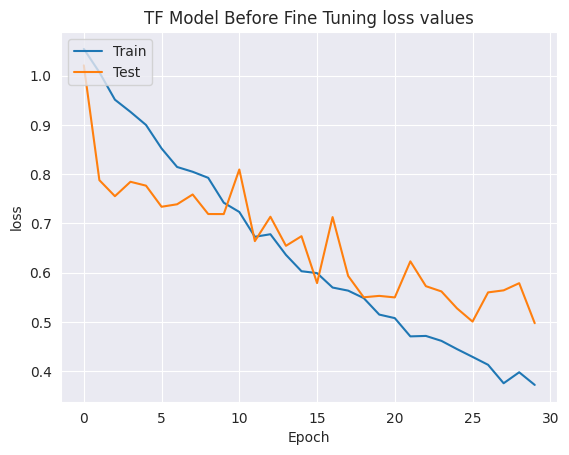

In [ ]:
_# Plot training & validation loss values
plt.plot(history1.history['loss'])
plt.plot(history1.history['val_loss'])
plt.title('TF Model Before Fine Tuning loss values')
plt.ylabel('loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

In [ ]:
train_score1 = model.evaluate(train_gen, verbose= 1)
valid_score1 = model.evaluate(val_gen, verbose= 1)
test_score1 = model.evaluate(test_gen, verbose= 1)

print("Train Loss: ", train_score1[0])
print("Train Accuracy: ", train_score1[1])
print('-' * 20)
print("Validation Loss: ", valid_score1[0])
print("Validation Accuracy: ", valid_score1[1])
print('-' * 20)
print("Test Loss: ", test_score1[0])
print("Test Accuracy: ", test_score1[1])



110/110 ━━━━━━━━━━━━━━━━━━━━ 59s 533ms/step - accuracy: 0.8911 - loss: 0.3066


W0000 00:00:1715300395.133449     106 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 104ms/step - accuracy: 0.8279 - loss: 0.5148
24/24 ━━━━━━━━━━━━━━━━━━━━ 10s 413ms/step - accuracy: 0.8111 - loss: 0.4970
Train Loss:  0.3095097243785858
Train Accuracy:  0.8916833400726318
--------------------
Validation Loss:  0.49758023023605347
Validation Accuracy:  0.821094810962677
--------------------
Test Loss:  0.5523535013198853
Test Accuracy:  0.8029294013977051


W0000 00:00:1715300407.931159     108 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


In [ ]:
preds1 = model.predict(test_gen)
y_pred1 = np.argmax(preds1, axis=1)

 3/24 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step  

W0000 00:00:1715300409.114154     109 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


24/24 ━━━━━━━━━━━━━━━━━━━━ 4s 140ms/step


W0000 00:00:1715300412.321236     108 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


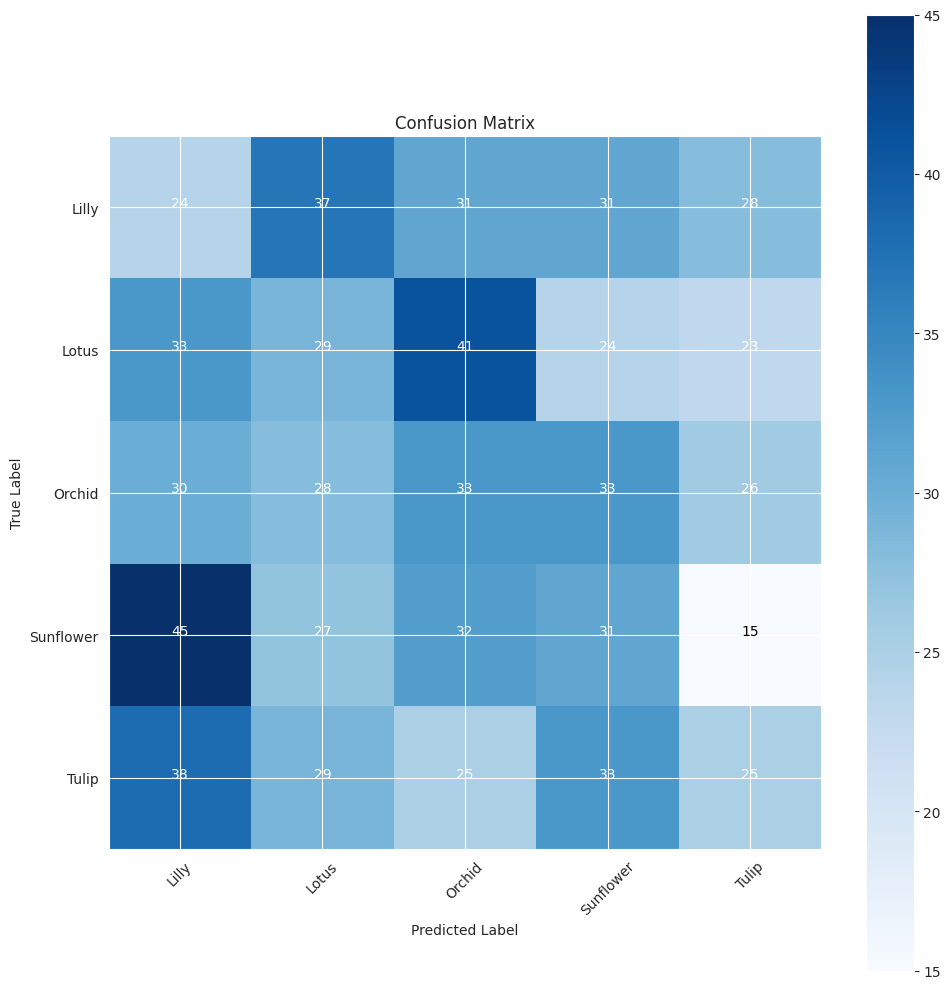

In [ ]:
g_dict = test_gen.class_indices
classes = list(g_dict.keys())

# Confusion matrix
cm = confusion_matrix(test_gen.classes, y_pred1)
cm

plt.figure(figsize= (10, 10))
plt.imshow(cm, interpolation= 'nearest', cmap= plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation= 45)
plt.yticks(tick_marks, classes)

thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, cm[i, j], horizontalalignment= 'center',
             color= 'white' if cm[i, j] > thresh else 'black')

plt.tight_layout()
plt.ylabel('True Label')
plt.xlabel('Predicted Label')

plt.show()

In [ ]:
print(classification_report(test_gen.classes, y_pred1,
                            target_names= classes))

              precision    recall  f1-score   support

       Lilly       0.14      0.16      0.15       151
       Lotus       0.19      0.19      0.19       150
      Orchid       0.20      0.22      0.21       150
   Sunflower       0.20      0.21      0.21       150
       Tulip       0.21      0.17      0.19       150

    accuracy                           0.19       751
   macro avg       0.19      0.19      0.19       751
weighted avg       0.19      0.19      0.19       751



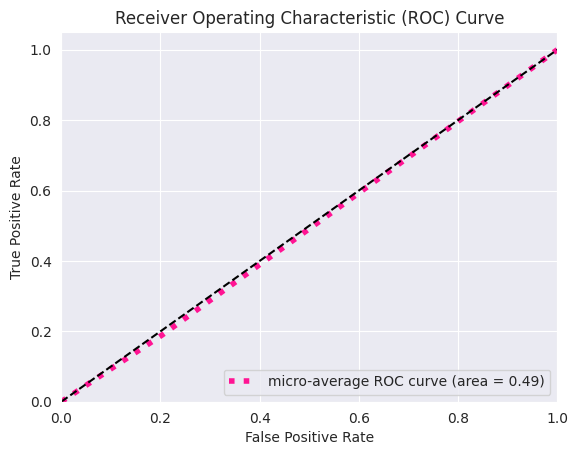

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

# Assuming you have predicted class indices for each sample
y_score1 = np.argmax(preds1, axis=1)

# Assuming test_generator.classes contains true class labels of your test data
y_true1 = test_gen.classes

# Binarize the true labels
n_classes = len(np.unique(y_true1))
y_true_binarized = label_binarize(y_true1, classes=np.arange(n_classes))

# Binarize the predicted class indices
y_score_binarized = label_binarize(y_score1, classes=np.arange(n_classes))

# Compute ROC curve and ROC area
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_binarized[:, i], y_score_binarized[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_true_binarized.ravel(), y_score_binarized.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# Plot micro-average ROC curve
plt.figure()
plt.plot(fpr["micro"], tpr["micro"], label='micro-average ROC curve (area = {0:0.2f})'.format(roc_auc["micro"]), color='deeppink', linestyle=':', linewidth=4)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


In [ ]:
preds11 = model.predict(train_gen)
y_pred11 = np.argmax(preds11, axis=1)

110/110 ━━━━━━━━━━━━━━━━━━━━ 58s 531ms/step


W0000 00:00:1715300493.970194     106 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


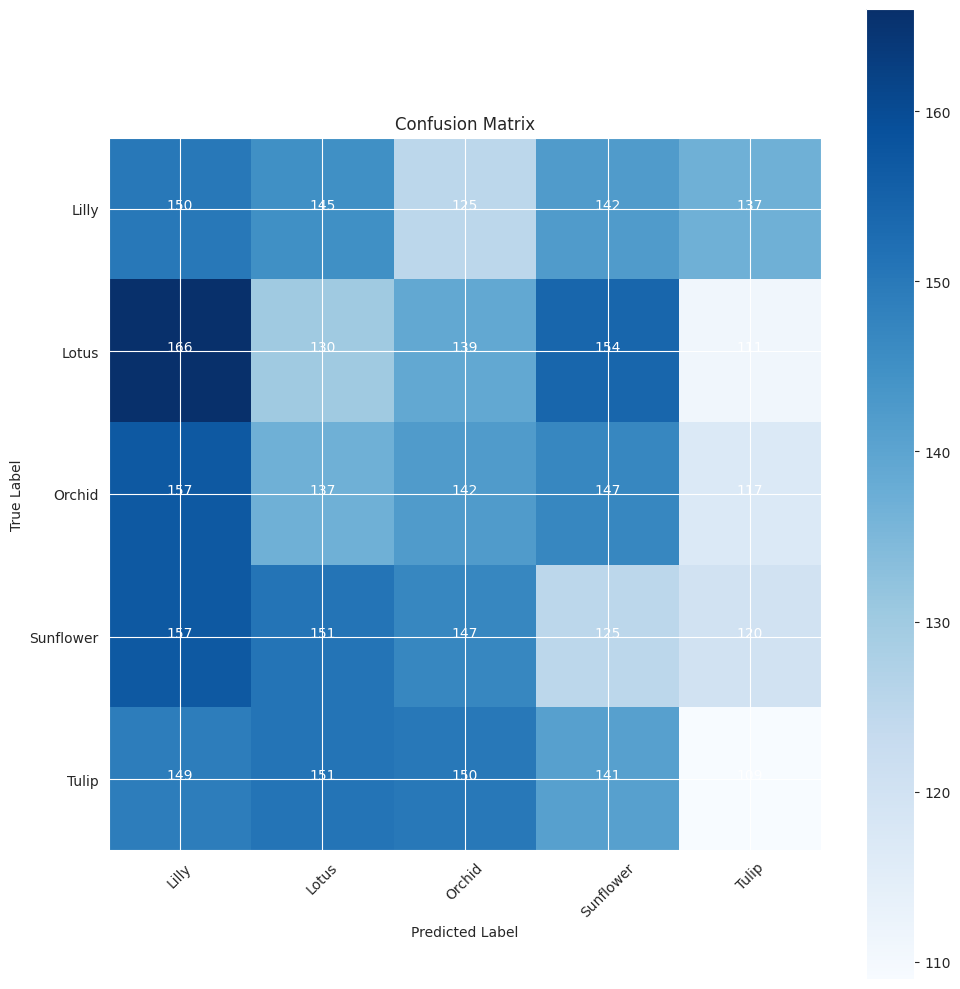

In [ ]:
g_dict = train_gen.class_indices
classes = list(g_dict.keys())

# Confusion matrix
cm = confusion_matrix(train_gen.classes, y_pred11)
cm

plt.figure(figsize= (10, 10))
plt.imshow(cm, interpolation= 'nearest', cmap= plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation= 45)
plt.yticks(tick_marks, classes)

thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, cm[i, j], horizontalalignment= 'center',
             color= 'white' if cm[i, j] > thresh else 'black')

plt.tight_layout()
plt.ylabel('True Label')
plt.xlabel('Predicted Label')

plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

# Assuming you have predicted class indices for each sample
y_score11 = np.argmax(preds1, axis=1)

# Assuming test_generator.classes contains true class labels of your test data
y_true11 = train_gen.classes

# Binarize the true labels
n_classes = len(np.unique(y_true11))
y_true_binarized = label_binarize(y_true11, classes=np.arange(n_classes))

# Binarize the predicted class indices
y_score_binarized = label_binarize(y_score11, classes=np.arange(n_classes))

# Compute ROC curve and ROC area
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_binarized[:, i], y_score_binarized[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_true_binarized.ravel(), y_score_binarized.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# Plot micro-average ROC curve
plt.figure()
plt.plot(fpr["micro"], tpr["micro"], label='micro-average ROC curve (area = {0:0.2f})'.format(roc_auc["micro"]), color='deeppink', linestyle=':', linewidth=4)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


ValueError: Found input variables with inconsistent numbers of samples: [3499, 751]

In [ ]:
batch_size = 16
image_size = (224,224)

gen = ImageDataGenerator()

# Define your ImageDataGenerator for augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    fill_mode='nearest',
    channel_shift_range=0.2  # You can adjust this value
)



train_gen =  gen.flow_from_dataframe(train_df, x_col = 'Filepath', y_col= 'Label',
                                   class_mode= 'categorical', color='rgb',
                                   batch_size=batch_size, target_size= image_size)

val_gen = gen.flow_from_dataframe(valid_df, x_col = 'Filepath', y_col= 'Label',
                                   class_mode= 'categorical', color='rgb',
                                   batch_size=batch_size, target_size= image_size)

test_gen = gen.flow_from_dataframe(test_df, x_col = 'Filepath', y_col= 'Label',
                                   class_mode= 'categorical', color='rgb',
                                   batch_size=batch_size, target_size= image_size)

Found 4500 validated image filenames belonging to 5 classes.
Found 250 validated image filenames belonging to 5 classes.
Found 250 validated image filenames belonging to 5 classes.


In [ ]:
history1 = model.fit(train_gen, epochs= 30, verbose= 1,
                    validation_data = val_gen, shuffle= False)

Epoch 1/30
282/282 ━━━━━━━━━━━━━━━━━━━━ 32s 115ms/step - accuracy: 0.8598 - loss: 0.4016 - val_accuracy: 0.8480 - val_loss: 0.4358
Epoch 2/30
282/282 ━━━━━━━━━━━━━━━━━━━━ 32s 113ms/step - accuracy: 0.9467 - loss: 0.1684 - val_accuracy: 0.9160 - val_loss: 0.2198
Epoch 3/30
282/282 ━━━━━━━━━━━━━━━━━━━━ 32s 112ms/step - accuracy: 0.9564 - loss: 0.1330 - val_accuracy: 0.9320 - val_loss: 0.2098
Epoch 4/30
282/282 ━━━━━━━━━━━━━━━━━━━━ 32s 113ms/step - accuracy: 0.9717 - loss: 0.0995 - val_accuracy: 0.9240 - val_loss: 0.2268
Epoch 5/30
282/282 ━━━━━━━━━━━━━━━━━━━━ 32s 113ms/step - accuracy: 0.9784 - loss: 0.0790 - val_accuracy: 0.9200 - val_loss: 0.2198
Epoch 6/30
282/282 ━━━━━━━━━━━━━━━━━━━━ 32s 112ms/step - accuracy: 0.9845 - loss: 0.0638 - val_accuracy: 0.9280 - val_loss: 0.2164
Epoch 7/30
282/282 ━━━━━━━━━━━━━━━━━━━━ 32s 113ms/step - accuracy: 0.9838 - loss: 0.0575 - val_accuracy: 0.9320 - val_loss: 0.2035
Epoch 8/30
282/282 ━━━━━━━━━━━━━━━━━━━━ 32s 113ms/step - accuracy: 0.9870 - loss: 0

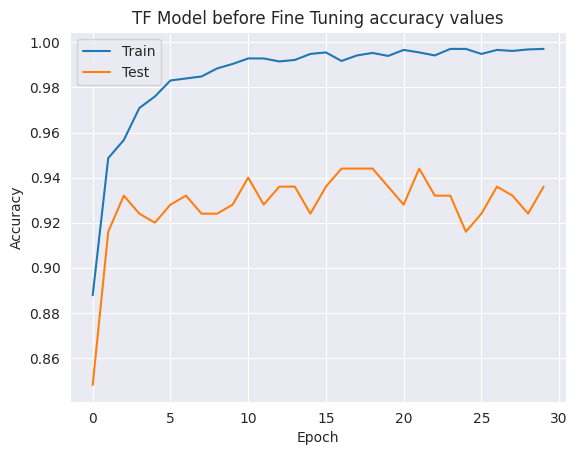

In [ ]:
_# Plot training & validation loss values
plt.plot(history1.history['accuracy'])
plt.plot(history1.history['val_accuracy'])
plt.title('TF Model before Fine Tuning accuracy values')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()


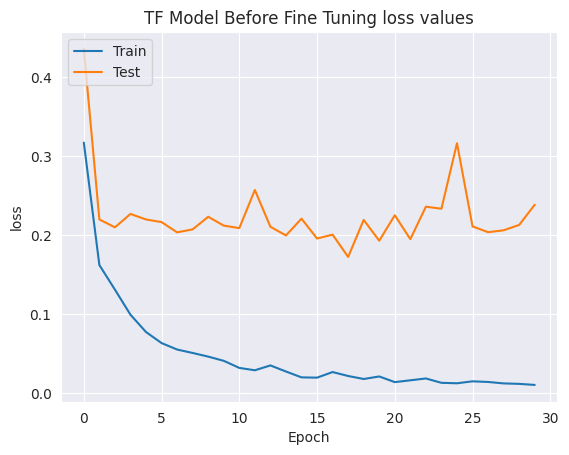

In [ ]:


_# Plot training & validation loss values
plt.plot(history1.history['loss'])
plt.plot(history1.history['val_loss'])
plt.title('TF Model Before Fine Tuning loss values')
plt.ylabel('loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()


In [ ]:

train_score1 = model.evaluate(train_gen, verbose= 1)
valid_score1 = model.evaluate(val_gen, verbose= 1)
test_score1 = model.evaluate(test_gen, verbose= 1)

print("Train Loss: ", train_score1[0])
print("Train Accuracy: ", train_score1[1])
print('-' * 20)
print("Validation Loss: ", valid_score1[0])
print("Validation Accuracy: ", valid_score1[1])
print('-' * 20)
print("Test Loss: ", test_score1[0])
print("Test Accuracy: ", test_score1[1])



282/282 ━━━━━━━━━━━━━━━━━━━━ 17s 62ms/step - accuracy: 0.9987 - loss: 0.0036
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - accuracy: 0.9118 - loss: 0.2474
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - accuracy: 0.9241 - loss: 0.3858
Train Loss:  0.005930454004555941
Train Accuracy:  0.9982222318649292
--------------------
Validation Loss:  0.23843346536159515
Validation Accuracy:  0.9359999895095825
--------------------
Test Loss:  0.36926451325416565
Test Accuracy:  0.9200000166893005


In [ ]:
preds1 = model.predict(test_gen)
y_pred1 = np.argmax(preds1, axis=1)



NameError: name 'model' is not defined

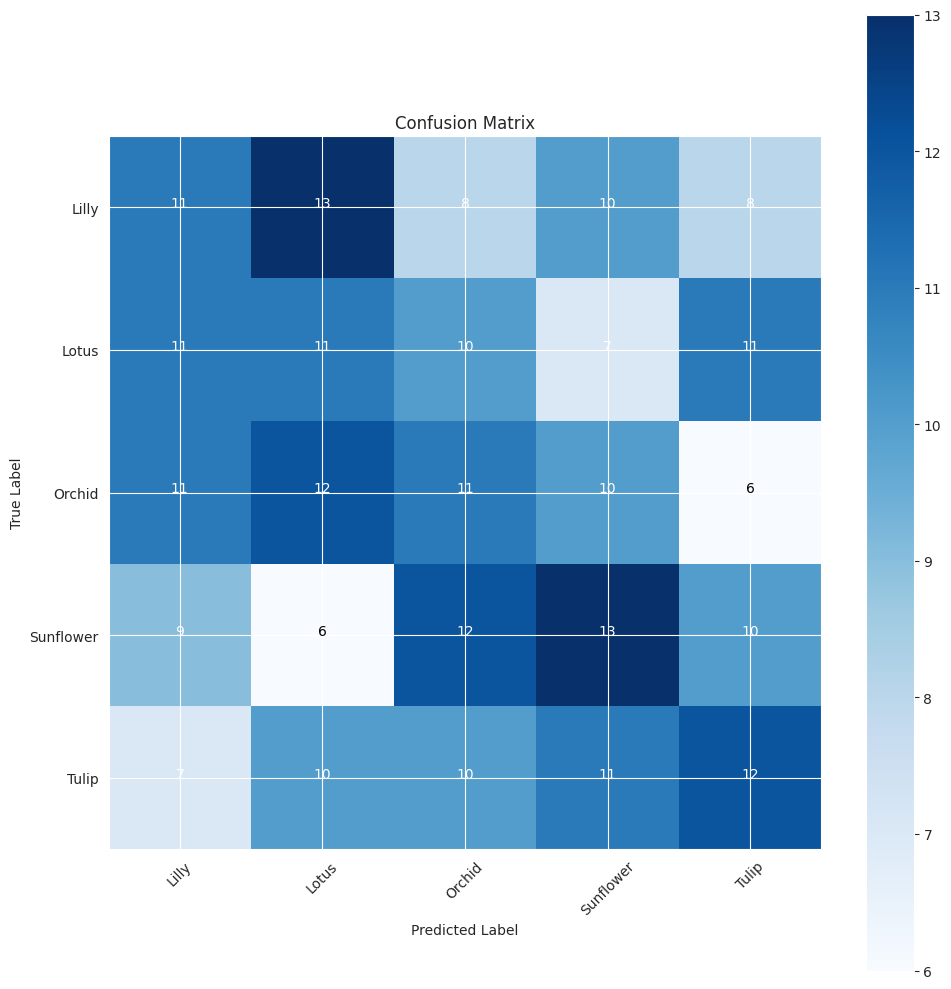

In [ ]:
g_dict = test_gen.class_indices
classes = list(g_dict.keys())

# Confusion matrix
cm = confusion_matrix(test_gen.classes, y_pred1)
cm

plt.figure(figsize= (10, 10))
plt.imshow(cm, interpolation= 'nearest', cmap= plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation= 45)
plt.yticks(tick_marks, classes)

thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, cm[i, j], horizontalalignment= 'center',
             color= 'white' if cm[i, j] > thresh else 'black')

plt.tight_layout()
plt.ylabel('True Label')
plt.xlabel('Predicted Label')

plt.show()



In [ ]:
print(classification_report(test_gen.classes, y_pred1,
                            target_names= classes))

              precision    recall  f1-score   support

       Lilly       0.22      0.22      0.22        50
       Lotus       0.21      0.22      0.22        50
      Orchid       0.22      0.22      0.22        50
   Sunflower       0.25      0.26      0.26        50
       Tulip       0.26      0.24      0.25        50

    accuracy                           0.23       250
   macro avg       0.23      0.23      0.23       250
weighted avg       0.23      0.23      0.23       250



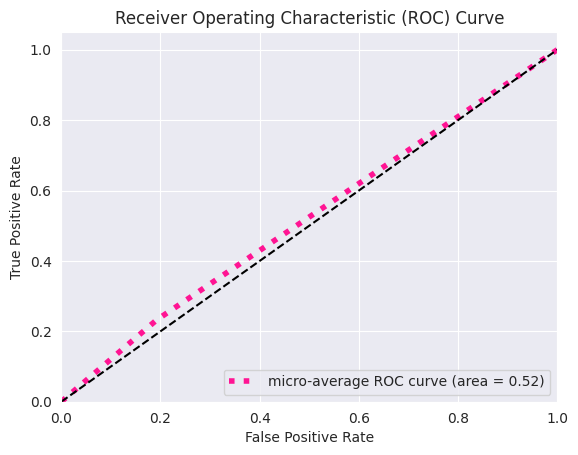

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

# Assuming you have predicted class indices for each sample
y_score1 = np.argmax(preds1, axis=1)

# Assuming test_generator.classes contains true class labels of your test data
y_true1 = test_gen.classes

# Binarize the true labels
n_classes = len(np.unique(y_true1))
y_true_binarized = label_binarize(y_true1, classes=np.arange(n_classes))

# Binarize the predicted class indices
y_score_binarized = label_binarize(y_score1, classes=np.arange(n_classes))

# Compute ROC curve and ROC area
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_binarized[:, i], y_score_binarized[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_true_binarized.ravel(), y_score_binarized.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# Plot micro-average ROC curve
plt.figure()
plt.plot(fpr["micro"], tpr["micro"], label='micro-average ROC curve (area = {0:0.2f})'.format(roc_auc["micro"]), color='deeppink', linestyle=':', linewidth=4)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


In [ ]:
import numpy as np


predictions1 = model.predict(test_gen)


predicted_classes = np.argmax(predictions1, axis=1)


true_classes = test_gen.classes


class_labels = list(test_gen.class_indices.keys())


for i in range(len(true_classes)):
    print(f"True class: {class_labels[true_classes[i]]}, Predicted class: {class_labels[predicted_classes[i]]}")



16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step
True class: Sunflower, Predicted class: Lotus
True class: Lilly, Predicted class: Tulip
True class: Sunflower, Predicted class: Orchid
True class: Orchid, Predicted class: Lilly
True class: Lotus, Predicted class: Tulip
True class: Tulip, Predicted class: Lilly
True class: Sunflower, Predicted class: Lotus
True class: Lilly, Predicted class: Tulip
True class: Tulip, Predicted class: Lilly
True class: Lilly, Predicted class: Lotus
True class: Lilly, Predicted class: Lotus
True class: Tulip, Predicted class: Lilly
True class: Orchid, Predicted class: Tulip
True class: Sunflower, Predicted class: Orchid
True class: Sunflower, Predicted class: Sunflower
True class: Lotus, Predicted class: Lotus
True class: Sunflower, Predicted class: Tulip
True class: Tulip, Predicted class: Orchid
True class: Tulip, Predicted class: Lotus
True class: Orchid, Predicted class: Lilly
True class: Lotus, Predicted class: Lilly
True class: Orchid, Predicted class: Tulip
T

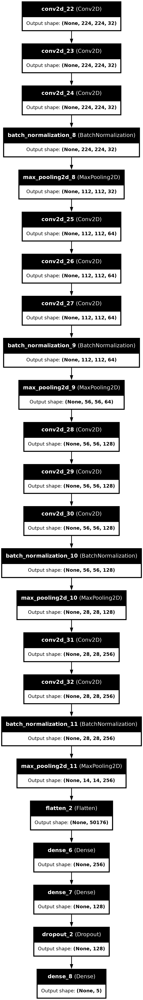

In [ ]:
import tensorflow as tf
from tensorflow import keras
tf.keras.utils.plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True)

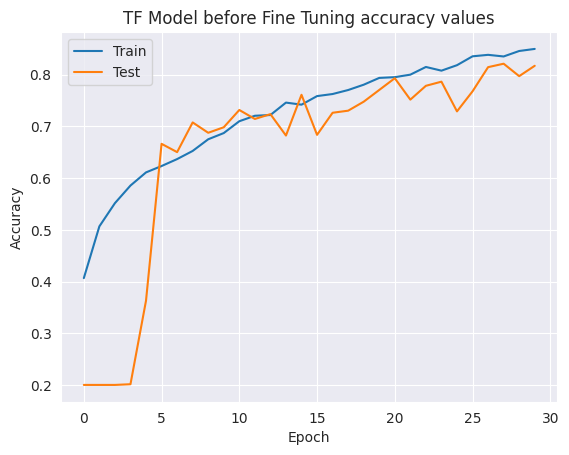

In [ ]:
_# Plot training & validation loss values
plt.plot(history1.history['accuracy'])
plt.plot(history1.history['val_accuracy'])
plt.title('TF Model before Fine Tuning accuracy values')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

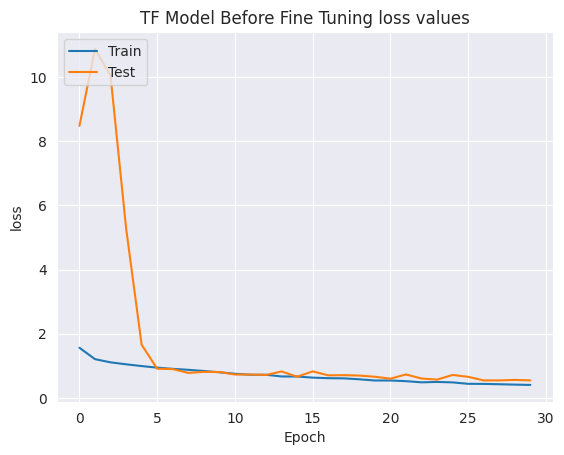

In [ ]:
_# Plot training & validation loss values
plt.plot(history1.history['loss'])
plt.plot(history1.history['val_loss'])
plt.title('TF Model Before Fine Tuning loss values')
plt.ylabel('loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

In [ ]:
train_score1 = model.evaluate(train_gen, verbose= 1)
valid_score1 = model.evaluate(val_gen, verbose= 1)
test_score1 = model.evaluate(test_gen, verbose= 1)

print("Train Loss: ", train_score1[0])
print("Train Accuracy: ", train_score1[1])
print('-' * 20)
print("Validation Loss: ", valid_score1[0])
print("Validation Accuracy: ", valid_score1[1])
print('-' * 20)
print("Test Loss: ", test_score1[0])
print("Test Accuracy: ", test_score1[1])

110/110 ━━━━━━━━━━━━━━━━━━━━ 46s 416ms/step - accuracy: 0.9129 - loss: 0.2552
24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - accuracy: 0.8217 - loss: 0.5289
24/24 ━━━━━━━━━━━━━━━━━━━━ 9s 373ms/step - accuracy: 0.8081 - loss: 0.4987
Train Loss:  0.2726616859436035
Train Accuracy:  0.9076879024505615
--------------------
Validation Loss:  0.5446312427520752
Validation Accuracy:  0.8170894384384155
--------------------
Test Loss:  0.48409366607666016
Test Accuracy:  0.8175765872001648


W0000 00:00:1715269166.202522     153 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


In [ ]:
preds1 = model.predict(test_gen)
y_pred1 = np.argmax(preds1, axis=1)

 3/24 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step 

W0000 00:00:1715269174.457886     154 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


24/24 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step


W0000 00:00:1715269177.275861     153 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


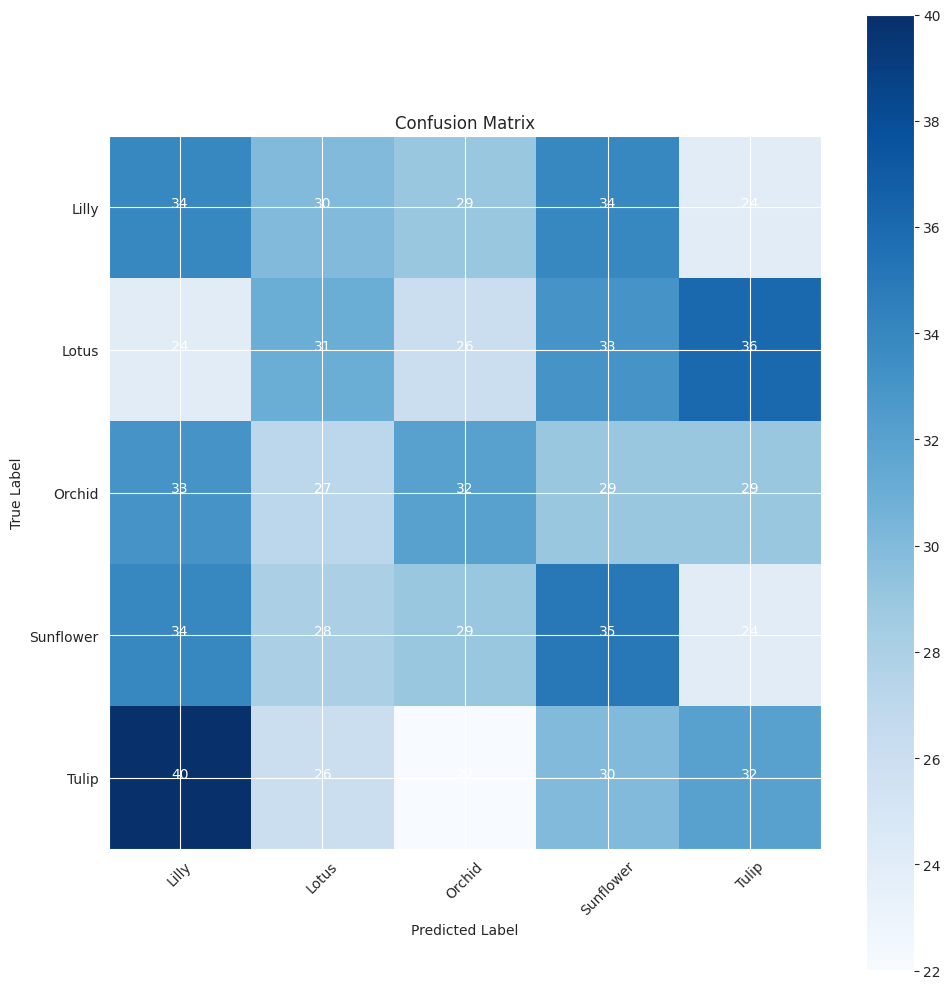

In [ ]:
g_dict = test_gen.class_indices
classes = list(g_dict.keys())

# Confusion matrix
cm = confusion_matrix(test_gen.classes, y_pred1)
cm

plt.figure(figsize= (10, 10))
plt.imshow(cm, interpolation= 'nearest', cmap= plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation= 45)
plt.yticks(tick_marks, classes)

thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, cm[i, j], horizontalalignment= 'center',
             color= 'white' if cm[i, j] > thresh else 'black')

plt.tight_layout()
plt.ylabel('True Label')
plt.xlabel('Predicted Label')

plt.show()

In [ ]:
print(classification_report(test_gen.classes, y_pred1,
                            target_names= classes))

              precision    recall  f1-score   support

       Lilly       0.21      0.23      0.22       151
       Lotus       0.22      0.21      0.21       150
      Orchid       0.23      0.21      0.22       150
   Sunflower       0.22      0.23      0.23       150
       Tulip       0.22      0.21      0.22       150

    accuracy                           0.22       751
   macro avg       0.22      0.22      0.22       751
weighted avg       0.22      0.22      0.22       751



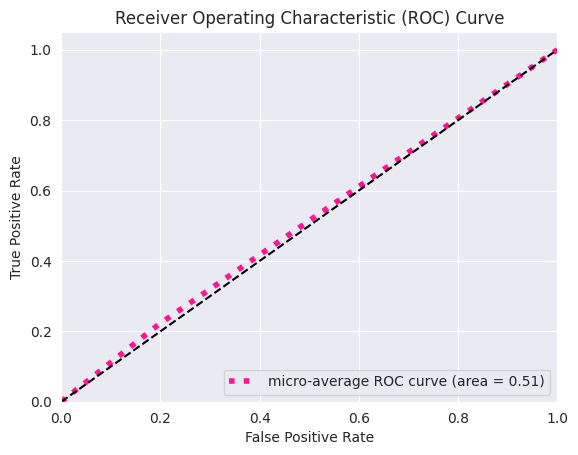

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

# Assuming you have predicted class indices for each sample
y_score1 = np.argmax(preds1, axis=1)

# Assuming test_generator.classes contains true class labels of your test data
y_true1 = test_gen.classes

# Binarize the true labels
n_classes = len(np.unique(y_true1))
y_true_binarized = label_binarize(y_true1, classes=np.arange(n_classes))

# Binarize the predicted class indices
y_score_binarized = label_binarize(y_score1, classes=np.arange(n_classes))

# Compute ROC curve and ROC area
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_binarized[:, i], y_score_binarized[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_true_binarized.ravel(), y_score_binarized.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# Plot micro-average ROC curve
plt.figure()
plt.plot(fpr["micro"], tpr["micro"], label='micro-average ROC curve (area = {0:0.2f})'.format(roc_auc["micro"]), color='deeppink', linestyle=':', linewidth=4)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


In [ ]:
import numpy as np


predictions = model.predict(test_generator)


predicted_classes = np.argmax(predictions, axis=1)


true_classes = test_generator.classes


class_labels = list(test_generator.class_indices.keys())


for i in range(len(true_classes)):
    print(f"True class: {class_labels[true_classes[i]]}, Predicted class: {class_labels[predicted_classes[i]]}")


In [ ]:
import matplotlib.pyplot as plt


test_images, test_labels = next(test_generator)


predictions = model.predict(test_images)
predicted_classes = np.argmax(predictions, axis=1)


class_labels = list(test_generator.class_indices.keys())


plt.figure(figsize=(15, 15))
num_plots = min(len(test_images), 10)
for i in range(num_plots):
    plt.subplot(5, 5, i + 1)
    plt.imshow(test_images[i])
    plt.axis('off')
    true_label = class_labels[np.argmax(test_labels[i])]
    predicted_label = class_labels[predicted_classes[i]]
    color = 'green' if true_label == predicted_label else 'red'
    plt.title(f'True: {true_label}\nPredicted: {predicted_label}', color=color)
plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import array_to_img


test_data = [(test_generator[i][0][0], test_generator[i][1][0]) for i in range(len(test_generator))]


class_names = ['Lilly', 'Lotus', 'Sunflower', 'Orchid', 'Tulip' ]

fig, ax = plt.subplots(figsize=(8, 12), ncols=3, nrows=4)

for row in range(4):
    i = np.random.randint(0, high=len(test_data))
    img, label = test_data[i]


    img = array_to_img(img)


    percent = model.predict(np.expand_dims(img, axis=0))[0]
    pred_class_idx = np.argmax(percent)
    pred_class_name = class_names[pred_class_idx]


    true_class_idx = np.argmax(label)
    true_class_name = class_names[true_class_idx]


    ax[row][0].imshow(img)
    ax[row][0].set_title('Real : {}'.format(true_class_name))
    ax[row][0].axis('off')


    ax[row][1].barh(class_names, percent)
    ax[row][1].set_aspect(0.1)
    ax[row][1].set_title('Predicted Class: {} ({}%)'.format(pred_class_name, round(percent[pred_class_idx] * 100, 2)))
    ax[row][1].set_xlim(0, 1.)


    color = 'green' if pred_class_idx == true_class_idx else 'red'

    ax[row][2].barh(class_names, percent, color=color)
    ax[row][2].set_aspect(0.1)
    ax[row][2].set_title('Prediction Correctness')
    ax[row][2].set_xlim(0, 1.)

plt.tight_layout()
plt.show()


CNN

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, BatchNormalization, Dropout, Flatten, Dense, Activation

IMG_SIZE = 150

model1 = Sequential()
model1.add(Conv2D(filters = 32, kernel_size = (5,5),padding = 'Same',activation ='relu', input_shape = (150,150,3)))
model1.add(MaxPooling2D(pool_size=(2,2)))


model1.add(Conv2D(filters = 64, kernel_size = (3,3),padding = 'Same',activation ='relu'))
model1.add(MaxPooling2D(pool_size=(2,2), strides=(2,2)))


model1.add(Conv2D(filters =96, kernel_size = (3,3),padding = 'Same',activation ='relu'))
model1.add(MaxPooling2D(pool_size=(2,2), strides=(2,2)))

model1.add(Conv2D(filters = 96, kernel_size = (3,3),padding = 'Same',activation ='relu'))
model1.add(MaxPooling2D(pool_size=(2,2), strides=(2,2)))

model1.add(Flatten())
model1.add(Dense(512))
model1.add(Activation('relu'))
model1.add(Dense(5, activation = "softmax"))



/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


In [ ]:
batch_size=128
epochs=30

from keras.callbacks import ReduceLROnPlateau
red_lr= ReduceLROnPlateau(monitor='val_acc',patience=3,verbose=1,factor=0.1)

In [ ]:

model1.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
model1.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 150, 150, 32)   │         2,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 75, 75, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 75, 75, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 37, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 37, 37, 96)     │        55,392 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 18, 18, 96)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 18, 18, 96)     │        83,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 9, 9, 96)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 7776)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │     3,981,824 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 5)              │         2,565 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,143,749 (15.81 MB)

 Trainable params: 4,143,749 (15.81 MB)

 Non-trainable params: 0 (0.00 B)

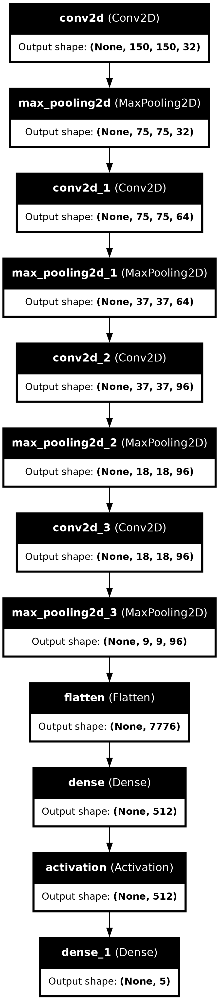

In [ ]:

import tensorflow as tf
from tensorflow import keras
tf.keras.utils.plot_model(model1, to_file='model.png', show_shapes=True, show_layer_names=True)

**2. Train the Model:[3]**

* Once the model is built, Train your model for as many epochs you think is necessary. cautions: Think about the computing complexity, we suggest you to utilize the GPU of the Google Colab.!!!

In [ ]:

history1 = model1.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    epochs=10, #epochs,
    validation_data=val_generator,
    validation_steps=val_generator.samples // val_generator.batch_size
)


Epoch 1/10
109/109 ━━━━━━━━━━━━━━━━━━━━ 32s 276ms/step - accuracy: 0.6027 - loss: 0.9646 - val_accuracy: 0.6073 - val_loss: 0.9183
Epoch 2/10
109/109 ━━━━━━━━━━━━━━━━━━━━ 0s 190us/step - accuracy: 0.6562 - loss: 0.8260 - val_accuracy: 0.3846 - val_loss: 1.2579
Epoch 3/10
109/109 ━━━━━━━━━━━━━━━━━━━━ 32s 277ms/step - accuracy: 0.6585 - loss: 0.8628 - val_accuracy: 0.6427 - val_loss: 0.9238
Epoch 4/10
109/109 ━━━━━━━━━━━━━━━━━━━━ 0s 194us/step - accuracy: 0.5000 - loss: 1.0825 - val_accuracy: 0.4615 - val_loss: 1.4785
Epoch 5/10
109/109 ━━━━━━━━━━━━━━━━━━━━ 32s 279ms/step - accuracy: 0.6612 - loss: 0.8565 - val_accuracy: 0.6644 - val_loss: 0.8507
Epoch 6/10
109/109 ━━━━━━━━━━━━━━━━━━━━ 0s 183us/step - accuracy: 0.8125 - loss: 0.5099 - val_accuracy: 0.7692 - val_loss: 0.9553
Epoch 7/10
109/109 ━━━━━━━━━━━━━━━━━━━━ 32s 278ms/step - accuracy: 0.6764 - loss: 0.8066 - val_accuracy: 0.6590 - val_loss: 0.8832
Epoch 8/10
109/109 ━━━━━━━━━━━━━━━━━━━━ 0s 203us/step - accuracy: 0.7188 - loss: 0.751

* You can use any optimizer and loss function of your choice.

* Please, Plot and show training loss/validation loss behaviour for each iterations.

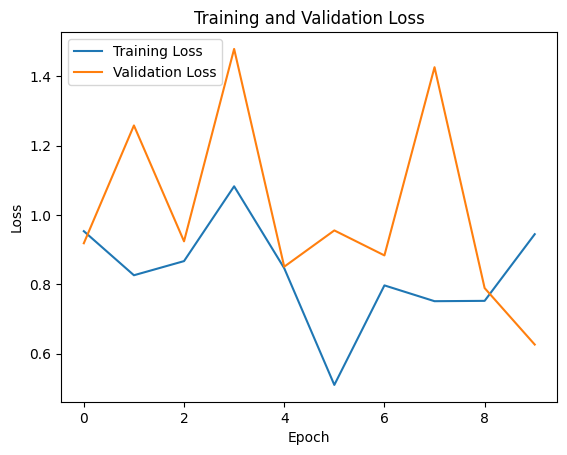

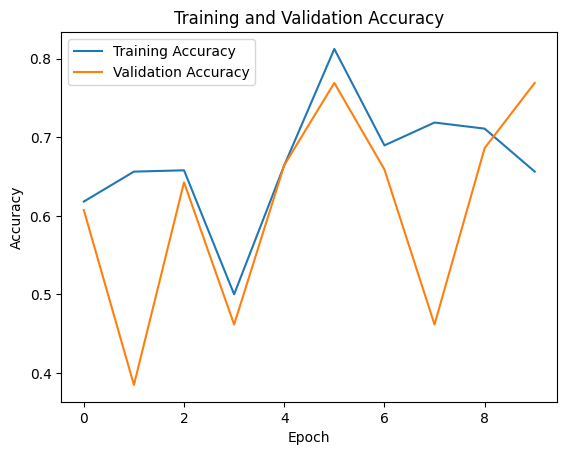

In [ ]:

training_accuracy1 = history1.history['accuracy']
validation_accuracy1 = history1.history['val_accuracy']


training_loss1 = history1.history['loss']
validation_loss1 = history1.history['val_loss']


plt.plot(training_loss1, label='Training Loss')
plt.plot(validation_loss1, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()


plt.plot(training_accuracy1, label='Training Accuracy')
plt.plot(validation_accuracy1, label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.show()


**3. Evaluate the Model:[3]**

* Pick appropriate evaluation metrics to evaluate your model.

* Interpret and compare the performance on Train Set and Test Set.

In [ ]:

test_loss1, test_accuracy1 = model1.evaluate(test_generator, steps=test_generator.samples // test_generator.batch_size)


print("Test Accuracy:", test_accuracy1)


23/23 ━━━━━━━━━━━━━━━━━━━━ 2s 91ms/step - accuracy: 0.6690 - loss: 0.8622
Test Accuracy: 0.679347813129425


In [ ]:
def get_pred(model, test_gen):

    preds = model.predict(test_gen)
    y_pred = np.argmax(preds, axis = 1)

    return y_pred

import itertools
def plot_confusion_matrix(test_gen, y_pred):

    g_dict = test_gen.class_indices
    classes = list(g_dict.keys())

    # Display the confusion matrix
    cm = confusion_matrix(test_gen.classes, y_pred)

    plt.figure(figsize= (10, 10))
    plt.imshow(cm, interpolation= 'nearest', cmap= plt.cm.Blues)
    plt.title('Confusion Matrix')
    plt.colorbar()

    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation= 45)
    plt.yticks(tick_marks, classes)

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j], horizontalalignment= 'center', color= 'white' if cm[i, j] > thresh else 'black')


    plt.tight_layout()
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')

    plt.show()

24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 81ms/step


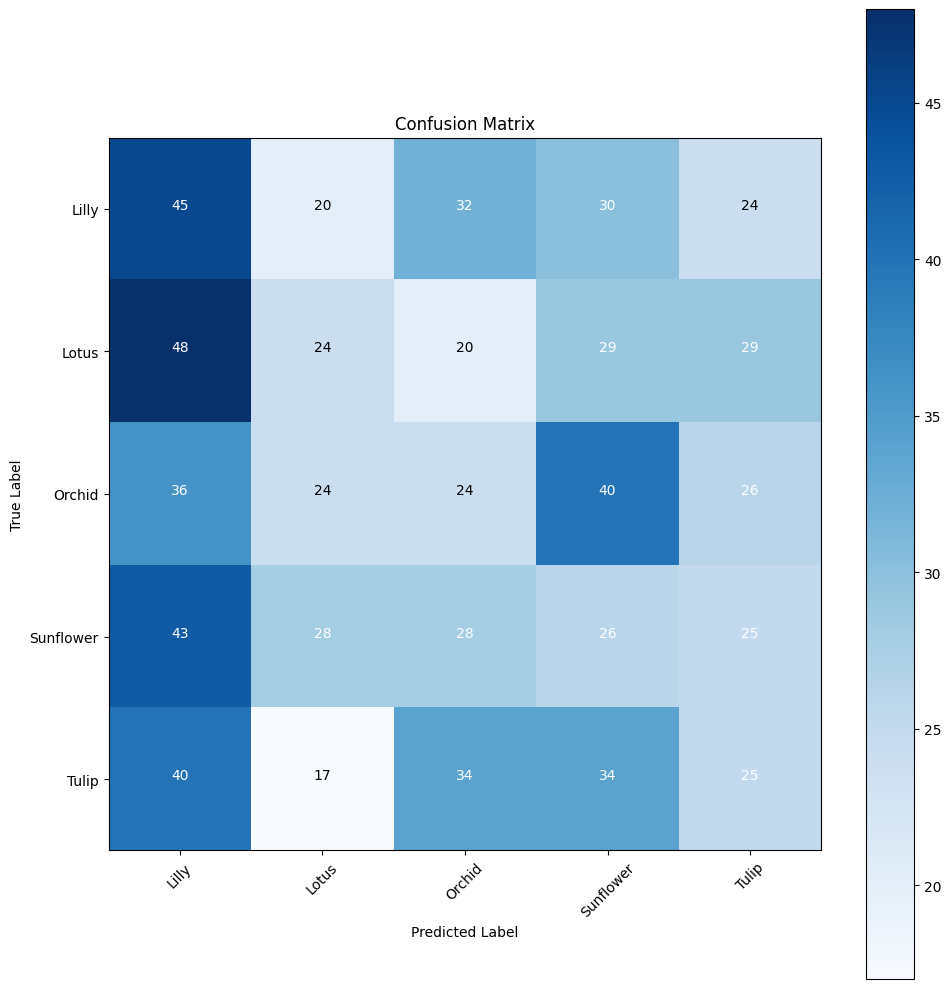

In [ ]:
import numpy as np
from sklearn.metrics import confusion_matrix
y_pred1 = get_pred(model1, test_generator)
plot_confusion_matrix(test_generator, y_pred1)



24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step


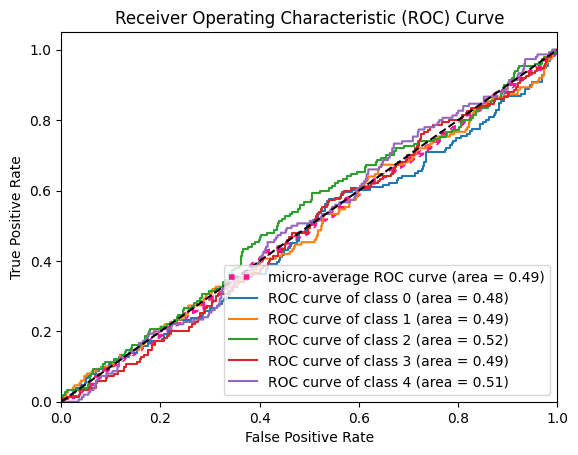

Test Accuracy: 0.679347813129425


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from scipy import interp

# Make predictions on test data
preds1 = model1.predict(test_generator)

# Binarize the true labels
test_labels = label_binarize(test_generator.classes, classes=np.arange(preds1.shape[1]))

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(preds1.shape[1]):
    fpr[i], tpr[i], _ = roc_curve(test_labels[:, i], preds1[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(test_labels.ravel(), preds1.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# Plot ROC curve for each class
plt.figure()
plt.plot(fpr["micro"], tpr["micro"], label='micro-average ROC curve (area = {0:0.2f})'.format(roc_auc["micro"]), color='deeppink', linestyle=':', linewidth=4)

for i in range(preds1.shape[1]):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Print test accuracy
print("Test Accuracy:", test_accuracy1)


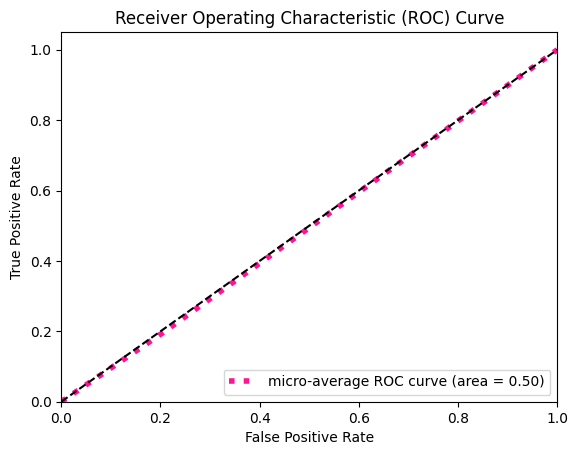

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

# Assuming you have predicted class indices for each sample
y_score1 = np.argmax(preds1, axis=1)

# Assuming test_generator.classes contains true class labels of your test data
y_true1 = test_generator.classes

# Binarize the true labels
n_classes = len(np.unique(y_true1))
y_true_binarized = label_binarize(y_true1, classes=np.arange(n_classes))

# Binarize the predicted class indices
y_score_binarized = label_binarize(y_score1, classes=np.arange(n_classes))

# Compute ROC curve and ROC area
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_binarized[:, i], y_score_binarized[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_true_binarized.ravel(), y_score_binarized.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# Plot micro-average ROC curve
plt.figure()
plt.plot(fpr["micro"], tpr["micro"], label='micro-average ROC curve (area = {0:0.2f})'.format(roc_auc["micro"]), color='deeppink', linestyle=':', linewidth=4)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


**4. Prediction [3]:**


In this step we expect you to make an inference on the unseen data.

In [ ]:
import numpy as np


predictions = model.predict(test_generator)


predicted_classes = np.argmax(predictions, axis=1)


true_classes = test_generator.classes


class_labels = list(test_generator.class_indices.keys())


for i in range(len(true_classes)):
    print(f"True class: {class_labels[true_classes[i]]}, Predicted class: {class_labels[predicted_classes[i]]}")


In [ ]:
import matplotlib.pyplot as plt


test_images, test_labels = next(test_generator)


predictions = model.predict(test_images)
predicted_classes = np.argmax(predictions, axis=1)


class_labels = list(test_generator.class_indices.keys())


plt.figure(figsize=(15, 15))
num_plots = min(len(test_images), 10)
for i in range(num_plots):
    plt.subplot(5, 5, i + 1)
    plt.imshow(test_images[i])
    plt.axis('off')
    true_label = class_labels[np.argmax(test_labels[i])]
    predicted_label = class_labels[predicted_classes[i]]
    color = 'green' if true_label == predicted_label else 'red'
    plt.title(f'True: {true_label}\nPredicted: {predicted_label}', color=color)
plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import array_to_img


test_data = [(test_generator[i][0][0], test_generator[i][1][0]) for i in range(len(test_generator))]


class_names = ['daisy', 'dandelion', 'rose', 'sunflower', 'tulip' ]

fig, ax = plt.subplots(figsize=(8, 12), ncols=3, nrows=4)

for row in range(4):
    i = np.random.randint(0, high=len(test_data))
    img, label = test_data[i]


    img = array_to_img(img)


    percent = model.predict(np.expand_dims(img, axis=0))[0]
    pred_class_idx = np.argmax(percent)
    pred_class_name = class_names[pred_class_idx]


    true_class_idx = np.argmax(label)
    true_class_name = class_names[true_class_idx]


    ax[row][0].imshow(img)
    ax[row][0].set_title('Real : {}'.format(true_class_name))
    ax[row][0].axis('off')


    ax[row][1].barh(class_names, percent)
    ax[row][1].set_aspect(0.1)
    ax[row][1].set_title('Predicted Class: {} ({}%)'.format(pred_class_name, round(percent[pred_class_idx] * 100, 2)))
    ax[row][1].set_xlim(0, 1.)


    color = 'green' if pred_class_idx == true_class_idx else 'red'

    ax[row][2].barh(class_names, percent, color=color)
    ax[row][2].set_aspect(0.1)
    ax[row][2].set_title('Prediction Correctness')
    ax[row][2].set_xlim(0, 1.)

plt.tight_layout()
plt.show()


# **2.4 Task4: Transfer Learning.[12]**

In this step we expect you to fine tune a pre - trained model and evaluate the results.

**What is Transfer Learning?**

**In many real world deep learning applications, we utilize a pre-trained model weights achieved by training the models on a similar or related datasets. Many of these models can be loaded from KERAS (e.g. Inception, ResNet, VGG etc.), which are trained with IMAGENET datasets.**

**You can load a pre-trained model that suits your needs, modify its structure to fit your image classification task, and either freeze or fine-tune the model. Finally, you can use the trained model to perform image classification on the target dataset.**

In this section we expect you to perform following tasks:

**1. Select and Load a Pre - trained Model [3]**


Choose a pre-trained image classification model, such as VGG or ResNet.{Justify your selection.} Using a deep learning library, such as TensorFlow or Keras you can load the pre-trained model weights.

Transffer

In [ ]:
!pip install kaggle-uploader


/opt/conda/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


ERROR: Could not find a version that satisfies the requirement kaggle-uploader (from versions: none)
ERROR: No matching distribution found for kaggle-uploader


In [ ]:
from kaggle_uploader import upload

# Upload a file
upload()


In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D

# Load pre-trained ResNet50 model without the top classification layer
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(150, 150, 3))

# Freeze the weights of the pre-trained layers
for layer in base_model.layers:
    layer.trainable = False


# Add custom classification layers on top of the base model
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.25)(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.25)(x)
predictions = Dense(len(unique_labels), activation='softmax')(x)
# Create the final model
model2 = Model(inputs=base_model.input, outputs=predictions)

# model2.add(Flatten())
# model2.add(Dropout(0.3))
# model2.add(Dense(512, activation='relu'))
# model2.add(Dropout(0.25))
# model2.add(Dense(256, activation='relu'))
# model2.add(Dropout(0.25))
# model2.add(Dense(len(unique_labels), activation='softmax'))

model2.summary()



Exception: URL fetch failure on https://storage.googleapis.com/tensorflow/keras-applications/vgg16/vgg16_weights_tf_dim_ordering_tf_kernels_notop.h5: None -- [Errno -3] Temporary failure in name resolution

**2. Restructure the model [3]**

With addition or removal of some layers to fit the requirements of your specific image classification task.

{Explain any change you made on the chosen model to meet the requirements.}

In [ ]:

from tensorflow.keras.layers import *
from tensorflow.keras.models import *


base_model = VGG16(weights='imagenet', include_top=False, input_shape=(150, 150, 3))


for layer in base_model.layers:
    layer.trainable = False


unique_labels = os.listdir(train_dir)
model2 = Sequential()
model2.add(Input(shape=(150,150,3)))
model2.add(base_model)
model2.add(Flatten())
model2.add(Dropout(0.3))
model2.add(Dense(512, activation='relu'))
model2.add(Dropout(0.25))
model2.add(Dense(256, activation='relu'))
model2.add(Dropout(0.25))
model2.add(Dense(len(unique_labels), activation='softmax'))

model2.summary()

In [ ]:

tf.keras.utils.plot_model(model2, to_file='model.png', show_shapes=True, show_layer_names=True)

**3. Train the Model {Fine Tuning} [3]**

Freeze some or all of the layers in the model to prevent them from being modified during training, or fine-tune some of the layers to adapt the pre-trained weights to your specific task.

In [ ]:

model2.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])
epochs=2

history_fine_tuned = model2.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    epochs=epochs,
    validation_data=val_generator,
    validation_steps=val_generator.samples // val_generator.batch_size
)


In [ ]:
import numpy as np
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Generate predictions for the test data
predictions = model2.predict(test_generator)

# Convert predictions and true labels into arrays
y_pred = np.argmax(predictions, axis=1)
y_true = test_generator.classes

# Calculate confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred)

# Visualize confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.xlabel("Predicted labels")
plt.ylabel("True labels")
plt.title("Confusion Matrix")
plt.show()


**4. Evaluate the model [3]**

Evaluate the Model Performance on some unseen test data also perform few inferences.

In [ ]:

training_loss2 = history_fine_tuned.history['loss']
validation_loss2 = history_fine_tuned.history['val_loss']


training_accuracy2 = history_fine_tuned.history['accuracy']
validation_accuracy2 = history_fine_tuned.history['val_accuracy']


plt.plot(training_loss2, label='Training Loss')
plt.plot(validation_loss2, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()


plt.plot(training_accuracy2, label='Training Accuracy')
plt.plot(validation_accuracy2, label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.show()

In [ ]:

test_loss2, test_accuracy2 = model2.evaluate(test_generator, steps=test_generator.samples // test_generator.batch_size)


print("Test Accuracy:", test_accuracy2)


In [ ]:
def get_pred(model, test_gen):

    preds = model.predict(test_gen)
    y_pred = np.argmax(preds, axis = 1)

    return y_pred

import itertools
def plot_confusion_matrix(test_gen, y_pred):

    g_dict = test_gen.class_indices
    classes = list(g_dict.keys())

    # Display the confusion matrix
    cm = confusion_matrix(test_gen.classes, y_pred)

    plt.figure(figsize= (10, 10))
    plt.imshow(cm, interpolation= 'nearest', cmap= plt.cm.Blues)
    plt.title('Confusion Matrix')
    plt.colorbar()

    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation= 45)
    plt.yticks(tick_marks, classes)

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j], horizontalalignment= 'center', color= 'white' if cm[i, j] > thresh else 'black')


    plt.tight_layout()
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')

    plt.show()

In [ ]:
from sklearn.metrics import confusion_matrix
y_pred2 = get_pred(model2, test_generator)

plot_confusion_matrix(test_generator, y_pred2)

In [ ]:
from sklearn.metrics import accuracy_score, classification_report
target = ['daisy', 'dandelion', 'rose', 'sunflower', 'tulip']

print('Classification Report')
print('Validation Acc: %2.2f%%' %(100*accuracy_score(val_generator.classes, y_pred2)))
print(classification_report(val_generator.classes, y_pred2, target_names = target))

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from scipy import interp

# Make predictions on test data
preds2 = model2.predict(test_generator)

# Binarize the true labels
test_labels = label_binarize(test_generator.classes, classes=np.arange(preds2.shape[1]))

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(preds2.shape[1]):
    fpr[i], tpr[i], _ = roc_curve(test_labels[:, i], preds2[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(test_labels.ravel(), preds2.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# Plot ROC curve for each class
plt.figure()
plt.plot(fpr["micro"], tpr["micro"], label='micro-average ROC curve (area = {0:0.2f})'.format(roc_auc["micro"]), color='deeppink', linestyle=':', linewidth=4)

for i in range(preds2.shape[1]):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Print test accuracy
print("Test Accuracy:", test_accuracy2)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

# Make predictions on test data
preds2 = model2.predict(test_generator)

# Assuming you have predicted class indices for each sample
y_score2 = np.argmax(preds2, axis=1)

# Assuming test_generator.classes contains true class labels of your test data
y_true2 = test_generator.classes

# Binarize the true labels
n_classes = len(np.unique(y_true2))
y_true_binarized = label_binarize(y_true2, classes=np.arange(n_classes))

# Binarize the predicted class indices
y_score_binarized = label_binarize(y_score2, classes=np.arange(n_classes))

# Compute ROC curve and ROC area
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_binarized[:, i], y_score_binarized[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_true_binarized.ravel(), y_score_binarized.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# Plot micro-average ROC curve
plt.figure()
plt.plot(fpr["micro"], tpr["micro"], label='micro-average ROC curve (area = {0:0.2f})'.format(roc_auc["micro"]), color='deeppink', linestyle=':', linewidth=4)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


In [ ]:
import matplotlib.pyplot as plt


test_images, test_labels = next(test_generator)


predictions = model.predict(test_images)
predicted_classes = np.argmax(predictions, axis=1)


class_labels = list(test_generator.class_indices.keys())


plt.figure(figsize=(15, 15))
num_plots = min(len(test_images), 10)
for i in range(num_plots):
    plt.subplot(5, 5, i + 1)
    plt.imshow(test_images[i])
    plt.axis('off')
    true_label = class_labels[np.argmax(test_labels[i])]
    predicted_label = class_labels[predicted_classes[i]]
    color = 'green' if true_label == predicted_label else 'red'
    plt.title(f'True: {true_label}\nPredicted: {predicted_label}', color=color)
plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import array_to_img


test_data = [(test_generator[i][0][0], test_generator[i][1][0]) for i in range(len(test_generator))]


class_names = ['dandelion', 'daisy', 'sunflower', 'tulip', 'rose']

fig, ax = plt.subplots(figsize=(8, 12), ncols=3, nrows=4)

for row in range(4):
    i = np.random.randint(0, high=len(test_data))
    img, label = test_data[i]


    img = array_to_img(img)


    percent = model.predict(np.expand_dims(img, axis=0))[0]
    pred_class_idx = np.argmax(percent)
    pred_class_name = class_names[pred_class_idx]


    true_class_idx = np.argmax(label)
    true_class_name = class_names[true_class_idx]


    ax[row][0].imshow(img)
    ax[row][0].set_title('Real : {}'.format(true_class_name))
    ax[row][0].axis('off')


    ax[row][1].barh(class_names, percent)
    ax[row][1].set_aspect(0.1)
    ax[row][1].set_title('Predicted Class: {} ({}%)'.format(pred_class_name, round(percent[pred_class_idx] * 100, 2)))
    ax[row][1].set_xlim(0, 1.)


    color = 'green' if pred_class_idx == true_class_idx else 'red'

    ax[row][2].barh(class_names, percent, color=color)
    ax[row][2].set_aspect(0.1)
    ax[row][2].set_title('Prediction Correctness')
    ax[row][2].set_xlim(0, 1.)

plt.tight_layout()
plt.show()


In [ ]:

predictions = model.predict(test_generator)


predicted_classes = np.argmax(predictions, axis=1)


true_classes = test_generator.classes


class_labels = list(test_generator.class_indices.keys())


for i in range(len(true_classes)):
    print(f"True class: {class_labels[true_classes[i]]}, Predicted class: {class_labels[predicted_classes[i]]}")


Cautions:!!!


The dimensions of the images in your data may not be the same as that in the ImageNet data. You may have re-size the images to required dimensions, required by each model using ”flow from directory” and ImageDataGenerator functions from tensorflow or Keras.

ImageNet has 1000 classes and hence the last layer of the pre-trained model would have 1000 nodes. However, your dataset may have a few number of classes, To address this issue you may have to rebuild and redesign the final dense or linear layer of your model.

Fine-tuning on a small training data may be very expensive, One common trick is to freeze all the layers except the last linear layers section of your model.

# **2.5 Task5: Final Discussion.[3]**



In this step we want you to perform comparative evaluation between:

* Image Classification with Fully Connected Neural Network.
* Image Classification with Convolutional Neural Network.
* Image Classification with Transfer learning and fine - tuning.

Which gave you the best result? and Why do you think that happen?

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

# Assuming you have predicted class indices for each sample
y_score1 = np.argmax(preds, axis=1)
y_score2 = np.argmax(preds1, axis=1)
y_score3 = np.argmax(preds2, axis=1)

# Assuming test_generator.classes contains true class labels of your test data
y_true = test_generator.classes

# Binarize the true labels
n_classes = len(np.unique(y_true))
y_true_binarized = label_binarize(y_true, classes=np.arange(n_classes))

# Binarize the predicted class indices
y_score_binarized1 = label_binarize(y_score1, classes=np.arange(n_classes))
y_score_binarized2 = label_binarize(y_score2, classes=np.arange(n_classes))
y_score_binarized3 = label_binarize(y_score3, classes=np.arange(n_classes))

# Compute ROC curve and ROC area for each classifier
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_binarized[:, i], y_score_binarized1[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area for each classifier
fpr["micro"], tpr["micro"], _ = roc_curve(y_true_binarized.ravel(), y_score_binarized1.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# Plot micro-average ROC curve for the first classifier
plt.plot(fpr["micro"], tpr["micro"], label='Classifier 1 (area = {0:0.2f})'.format(roc_auc["micro"]), color='deeppink', linestyle=':', linewidth=4)

# Repeat the same process for the other classifiers
# Classifier 2
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_binarized[:, i], y_score_binarized2[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fpr["micro"], tpr["micro"], _ = roc_curve(y_true_binarized.ravel(), y_score_binarized2.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
plt.plot(fpr["micro"], tpr["micro"], label='Classifier 2 (area = {0:0.2f})'.format(roc_auc["micro"]), color='navy', linestyle=':', linewidth=4)

# Classifier 3
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_binarized[:, i], y_score_binarized3[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fpr["micro"], tpr["micro"], _ = roc_curve(y_true_binarized.ravel(), y_score_binarized3.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
plt.plot(fpr["micro"], tpr["micro"], label='Classifier 3 (area = {0:0.2f})'.format(roc_auc["micro"]), color='green', linestyle=':', linewidth=4)

# Plot the random guessing line
plt.plot([0, 1], [0, 1], 'k--')

# Set plot limits and labels
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt


train_batch = train_generator.next()


val_batch = val_generator.next()


test_batch = test_generator.next()


plt.figure(figsize=(10, 10))
for i in range(9):
    plt.subplot(3, 3, i + 1)
    plt.imshow(train_batch[0][i])
    plt.axis('off')
plt.suptitle('Augmented Images from Training Set')
plt.show()


plt.figure(figsize=(10, 10))
for i in range(9):
    plt.subplot(3, 3, i + 1)
    plt.imshow(val_batch[0][i])
    plt.axis('off')
plt.suptitle('Augmented Images from Validation Set')
plt.show()


plt.figure(figsize=(10, 10))
for i in range(9):
    plt.subplot(3, 3, i + 1)
    plt.imshow(test_batch[0][i])
    plt.axis('off')
plt.suptitle('Augmented Images from Test Set')
plt.show()


AttributeError: 'DirectoryIterator' object has no attribute 'next'

EFficient

In [ ]:
img_size = (224, 224)
channels = 3 #rgb
img_shape = (img_size[0], img_size[1], channels)
class_count = len(list(train_gen.class_indices.keys())) # to define number of classes in dense layer

# create pre-trained model (you can built on pretrained model such as :  efficientnet, VGG , Resnet )
# we will use efficientnetb3 from EfficientNet family.
base_model = tf.keras.applications.EfficientNetB3(include_top= False, weights= "imagenet",
                                                               input_shape= img_shape, pooling= 'max')

model2 = Sequential([
    base_model,
    BatchNormalization(axis= -1, momentum= 0.99, epsilon= 0.001),
    Dense(256, kernel_regularizer= regularizers.l2(l= 0.016), activity_regularizer= regularizers.l1(0.006),
                bias_regularizer= regularizers.l1(0.006), activation= 'relu'),
    Dropout(rate= 0.45, seed= 123),
    Dense(class_count, activation= 'softmax')
])
model2.compile(Adamax(learning_rate= 0.001), loss= 'categorical_crossentropy',
              metrics= ['accuracy', tf.keras.metrics.Precision(), tf.keras.metrics.Recall(),
                        tf.keras.metrics.AUC()])

model2.summary()

Exception: URL fetch failure on https://storage.googleapis.com/keras-applications/efficientnetb3_notop.h5: None -- [Errno -3] Temporary failure in name resolution

In [ ]:
history2= model2.fit(train_gen, epochs= 15, verbose= 1, validation_data= valid_gen, shuffle= False )

NameError: name 'model2' is not defined

In [ ]:
_# Plot training & validation loss values
plt.plot(history2.history['accuracy'])
plt.plot(history2.history['val_accuracy'])
plt.title('TF Model before Fine Tuning accuracy values')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()


In [ ]:
_# Plot training & validation loss values
plt.plot(history2.history['loss'])
plt.plot(history2.history['val_loss'])
plt.title('TF Model Before Fine Tuning loss values')
plt.ylabel('loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()


In [ ]:
train_score2= model2.evaluate(train_gen)
valid_score2= model2.evaluate(val_gen)
test_score2=  model2.evaluate(test_gen)

In [ ]:
print("Train Loss: ", train_score2[0])
print("Train Accuracy: ", train_score2[1])
print('-' * 20)
print("Valid Loss: ", valid_score2[0])
print("Valid Accuracy: ", valid_score2[1])
print('-' * 20)
print("Test Loss: ", test_score2[0])
print("Test Accuracy: ", test_score2[1])

In [ ]:
preds2 = model2.predict_generator(test_gen)
y_pred2= np.argmax(preds2,axis=1)

g_dict = test_gen.class_indices
classes = list(g_dict.keys())

# Confusion matrix
cm = confusion_matrix(test_gen.classes, y_pred2)

plt.figure(figsize= (10, 10))
plt.imshow(cm, interpolation= 'nearest', cmap= plt.cm.Greens)
plt.title('Confusion Matrix')
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation= 45)
plt.yticks(tick_marks, classes)


thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])): #(5,5)
    plt.text(j, i, cm[i, j], horizontalalignment= 'center', color= 'white' if cm[i, j] > thresh else 'black')

plt.tight_layout()
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()